# Identification
Please indicate your name

Student 1: Erisa Kohansal

Student 2: Sama Satariyan

# Practical work 7: Split and Merge

In this practical work, we implement and test the split and merge algorithm.

In [1]:
### Usefull libraries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

### Data
img_test = np.full((64,64),150,dtype=np.uint8)
img_test[32:48,16:16+32] = 100
img_test[8:24,40:56] = 50
angio = np.array(Image.open('img/angiogra.png'))
cam = np.array(Image.open('img/cameraman.png'))
muscle = np.array(Image.open('img/muscle.png'))
prisme = np.array(Image.open('img/prisme.png'))
seiche = np.array(Image.open('img/seiche.png'))

### Usefull functions
def neighbors(b,K):
    """ blockStat*list[blockStat]->list[blockStat]
        returns the list of neighbors of b and elements of K 
    """
    def belongsTo(x,y,a):
        """ int*int*BlockStat -> bool 
            Test if pixel (x,y) belongs to block a 
        """
        return x>=a[0] and y>=a[1] and x<a[0]+a[2] and y<a[1]+a[3]
    def areNeighbors(a,b):
        """ BlockStat**2 -> bool
            Test if a and b are neighbors
        """
        if a[2]>b[2] and a[3]>b[3]:
            a,b=b,a
        x,y = a[0]+a[2]//2,a[1]+a[3]//2
        return belongsTo(x+a[2],y,b) or belongsTo(x-a[2],y,b) or belongsTo(x,y+a[3],b) or belongsTo(x,y-a[3],b)
    return [n for n in K if areNeighbors(b,n)]

## Exercise 1

### Question 1
Write the recursive function ``split()`` discussed in tutorial work. 
It takes as input the image, a region, a predicate, and a variable number of arguments. 
The region is a Python formal type ``Block`` defined by:
```python
type Block = tuple[int**4]
```
The function ``split()`` returns a quadtree, a Python formal type, recursivelly defined by:
```python
type QuadTree = list[(QuadTree**4|Block)] 
```

The predicate is a Python function with the following signature:
```python
Array*Block*...->bool
```
It can take a variable number of parameters which correspond to the parameters required by the predicate.

In [2]:
# type Block = tuple[int**4]
# type QuadTree = list[(QuadTree**4|Block)] 

def split(I,reg,pred,*args): 
    """ Array*Block*(Array*Block*...->bool)*... -> 4-aire
        Performs a quadtree splitting of image I drived by a predicate
    """
    x,y,w,h = reg
    if pred(I,reg,*args) and w>args[1] and h>args[1]:
        regno = split(I, (x,      y,      w//2, h//2), pred, *args)
        regne = split(I, (x,      y+h//2, w//2, h//2), pred, *args)
        regso = split(I, (x+w//2, y,      w//2, h//2), pred, *args)
        regse = split(I, (x+w//2, y+h//2, w//2, h//2), pred, *args)
        return [regno, regne, regso, regse]
    return [reg]


### Question 2
Write the function ```predsplit(I,B,*args)``` with signature:
```python
Array*Block*... -> bool
```
that returns True if the standard deviation of image ``I`` computed in region ``B`` is greater than the first value of argument ``*args`` (it can be accessed simply by ``*args[0]``).

In [3]:
def predsplit(I,reg,*args):
    """ Array*Block*... -> bool
    """ 
    x,y,w,h = reg
    std = np.std(I[x:x+w,y:y+h])
    return std>args[0]

### Question 3
Write the function ``listRegions()`` which applies a depth-first search on the quadtree given as parameter, and returns the list of the leaves of the quadtree. 

Some recalls about lists in Python;
 - Initialization: `L = []` (empty list)
 - Add a element `a` into a list `L`: `L.append(a)`

In [4]:
def listRegions(L):
    """ QuadTree -> list[Block]
    """
    res = []
    if len(L) == 1:
        res =  L
    else:
        for i in range(len(L)):
            res += listRegions(L[i])
    return res

### Question 4
Test your codes on the synthetic image ``img_test`` seen in tutorial work. Print the value returned by ``split()`` as well as the one returned by ``listRegions()``. 

In [5]:
L = listRegions(split(img_test, (0, 0, *img_test.shape), predsplit, 0, 1))
# Unit test: L is the quadtree produced from img_test
assert len(L) == 25
print("OK")

OK


### Question 5
Write the function ```drawRegions(L,I)``` which takes as arguments a list of regions, an image, and returns an image  where the boundaries of each region have been traced with red color. Indication: the returned image is a hypermatrix of dimension 3, the third dimension is of size 3 and encodes the red, green and blue components of a RGB colorspace. Test the function on the previous example.

In [6]:
def drawRegions(LL,I,verbose=False,fig_title="",img1_title="image originale",img2_title="image segmentée", figsize=(8, 4)):
    """ list[Block]*Array -> Array
        parcours de la liste dessin des régions 
    """
    res = np.stack([I[:]]*3, axis=-1) # nous donne une image de forme (*I.shape, 3)
    # chaque ligne de res est composée d'une liste de trois valeurs RGB, 
    # cette liste représente la valeur du pixel : rgb[x,y] = [I[x,y],I[x,y],I[x,y]]
    red = [255,0,0]
    for reg in LL:
        x,y,n,m = reg
        res[x,y:y+m] = red
        res[x:x+n,y] = red
        # cette partie résulte en superposition des frontières
        # res[x+n-1,y:y+m] = red
        # res[x:x+n,y+m-1] = red
        
    # pour mieux gérer la superposition des frontières
    n,m = I.shape
    res[0:n,m-1] = red
    res[n-1,0:m] = red
    
    if verbose:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
        fig.suptitle(fig_title)
        ax[0].imshow(I, vmin=0, vmax=255, cmap="gray")
        ax[0].set_title(img1_title)
        ax[0].set_xticks(())
        ax[0].set_yticks(())
        ax[1].imshow(res)
        ax[1].set_title(img2_title)
        ax[1].set_xticks(())
        ax[1].set_yticks(())
        fig.tight_layout()
        plt.show()
    return res

### Question 6
Add a Gaussian noise with standard deviation 5 to the image ``img_test``. 
Apply the quadtree splitting on the noisy image by adjusting the threshold to obtain the same result as in the previous question. 
Which threshold value should be chosen? Does this make sense to you?

Hint: use the Numpy function ``random.randn()`` which generates random values according to a normal distribution (Gaussian distribution of null mean and variance 1). To obtain realizations of a Gaussian distribution of standard deviation $\sigma$, it is sufficient to multiply by $\sigma$ the realizations of a normal distribution. 

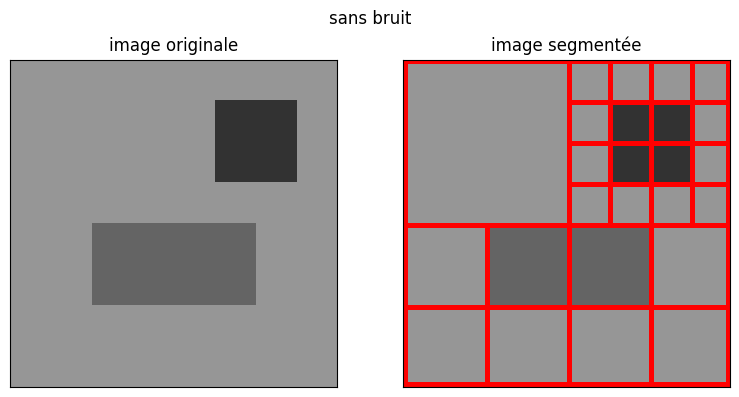

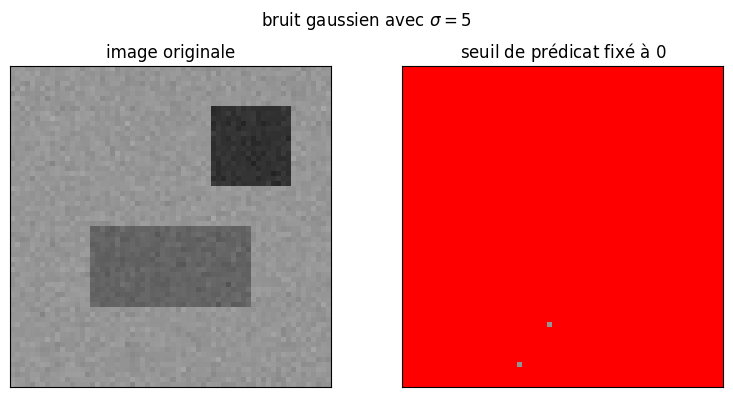

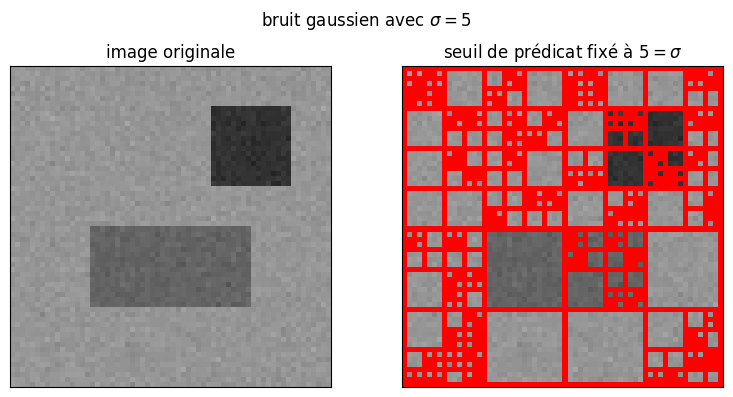

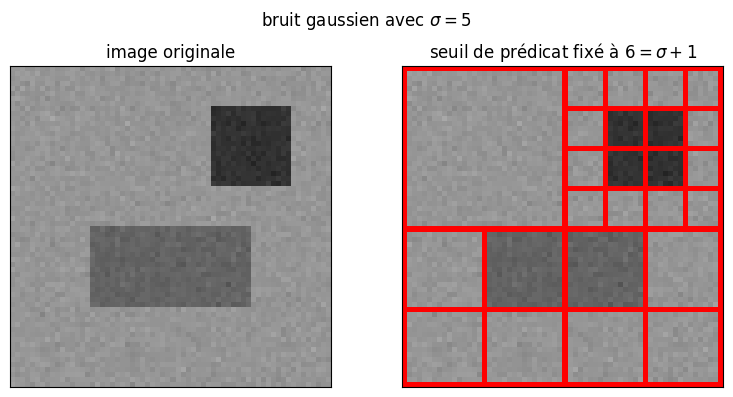

array([[[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[255,   0,   0],
        [158, 158, 158],
        [153, 153, 153],
        ...,
        [147, 147, 147],
        [153, 153, 153],
        [255,   0,   0]],

       [[255,   0,   0],
        [151, 151, 151],
        [157, 157, 157],
        ...,
        [155, 155, 155],
        [146, 146, 146],
        [255,   0,   0]],

       ...,

       [[255,   0,   0],
        [141, 141, 141],
        [148, 148, 148],
        ...,
        [153, 153, 153],
        [150, 150, 150],
        [255,   0,   0]],

       [[255,   0,   0],
        [152, 152, 152],
        [154, 154, 154],
        ...,
        [145, 145, 145],
        [146, 146, 146],
        [255,   0,   0]],

       [[255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]]

In [7]:
from numpy import random

gauss5 = random.randn(*img_test.shape) * 5
img_test5 = (img_test+gauss5).astype(int)
drawRegions(listRegions(split(img_test, (0,0,*img_test.shape), predsplit, 0, 1)), img_test, True, "sans bruit")
drawRegions(listRegions(split(img_test5, (0,0,*img_test5.shape), predsplit, 0, 1)), img_test5, True, "bruit gaussien avec $\sigma=5$", img2_title="seuil de prédicat fixé à $0$")
drawRegions(listRegions(split(img_test5, (0,0,*img_test5.shape), predsplit, 5, 1)), img_test5, True, "bruit gaussien avec $\sigma=5$", img2_title="seuil de prédicat fixé à $5=\sigma$")
drawRegions(listRegions(split(img_test5, (0,0,*img_test5.shape), predsplit, 6, 1)), img_test5, True, "bruit gaussien avec $\sigma=5$", img2_title="seuil de prédicat fixé à $6=\sigma+1$")

D'après le TD, lorsque nous appliquons un bruit gaussien avec un écart-type $\sigma$ à l'image, l'écart-type des intensités des pixels dans chaque région homogène augmente de $\sigma$. Or, le critère de division de l'algorithme split dépend en l'écart-type des intensités des pixels d'une région. Alors, il est nécessaire d'ajuster le seuil en fonction de cette augmentation d'écart-type pour obtenir le même résultat qu'auparavant : 
$$S_{bruitée} = S_{originale} + \sigma +1$$
En pratique, il vaut mieux de choisir un seuil qui a une valeur légèrement plus élevée d'où le $+1$.



## Exercise 2

Experiment the split algorithm on the 4 natural images provided. For each image try to find the threshold that seems to you visually the best. Display the number of regions obtained after splitting.

- Dans une région parfaitement homogène sans bruit, l'écart-type serait nul (comme c'est le cas pour ```img_test```). Pourtant, dans les images réelles il est peu probable que les régions aient un écart-type nul à cause de plusieurs choses comme les textures, le bruit, l'éclairage, etc. 

- Le seuil optimal est une valeur entre $0$ et l'écart-type de l'image:
$$0 \le S \le \sigma$$
Un seuil plus élevé réduit le nombre de régions, or ceci peut entraîner une perte de détails importants. Des zones distinctes mais avec des écarts-types similaires pourraient être fusionnées en une seule région.
En revanche, un seuil plus bas augmente le nombre de régions, capturant ainsi plus de détails. Cependant, cela peut conduire à une sur-segmentation où des régions homogènes sont divisées inutilement.

Remarque : Un seuil nul entraînera une sur-segmentation avec autant de régions que de pixels. Cependant, ceci n'est pas notre but.

Remarque : Un seuil supérieur à l'écart-type de l'image nous donne une seule région.

Voici les seuils choisis d'après les tests effectués : 

1. ```angio``` : $s_{angio} \approx 16$
2. ```cam``` : $s_{cam} \approx 30$
3. ```muscle``` : $s_{muscle} \approx 22$
4. ```prisme``` : $s_{prisme} \approx 15$
5. ```seiche``` : $s_{seiche} \approx 12$

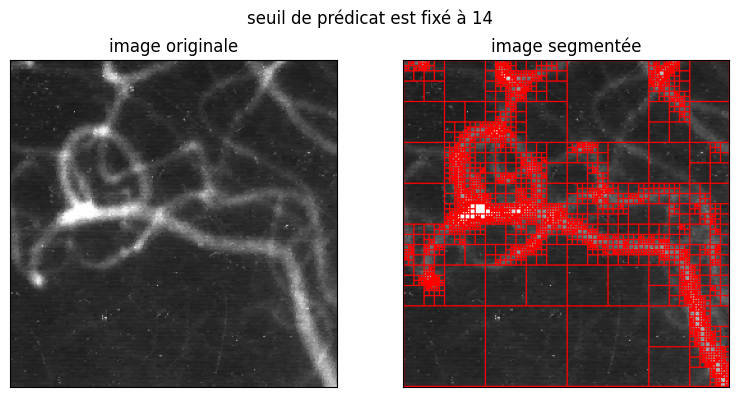

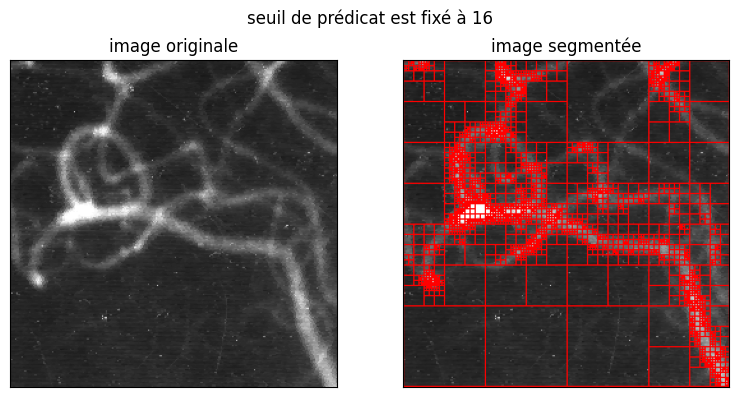

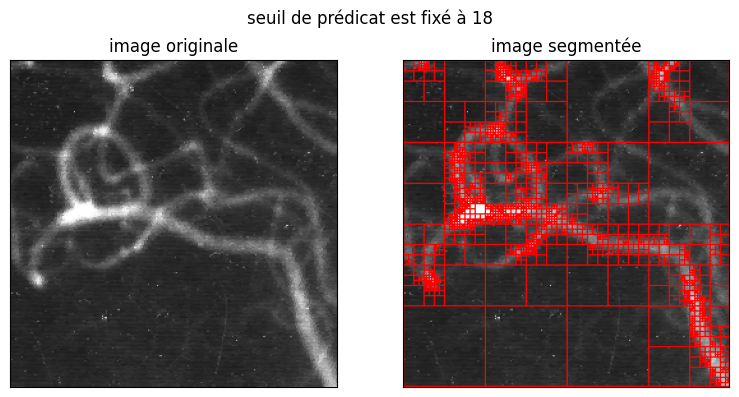

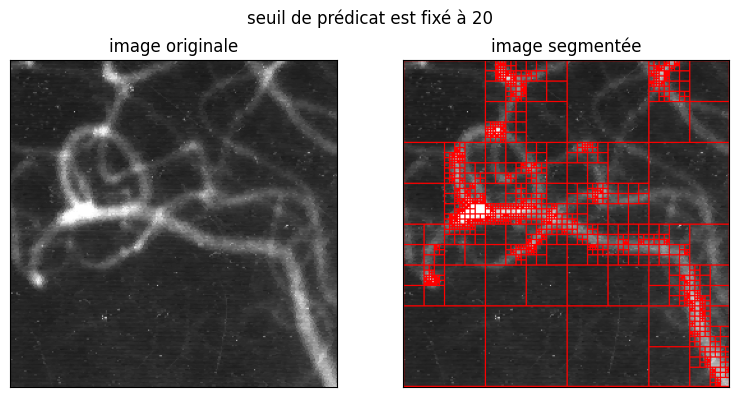

In [8]:
# angio = np.array(Image.open('img/angiogra.png'))

for i in [14,16,18,20]: # meilleure valeur aux alentours de 15? =18?
    drawRegions(listRegions(split(angio, (0,0,*angio.shape), predsplit, i, 1)), angio, True, f"seuil de prédicat est fixé à {i}")

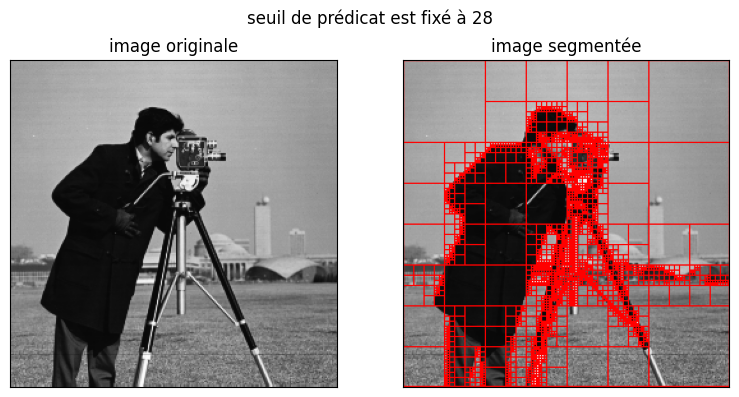

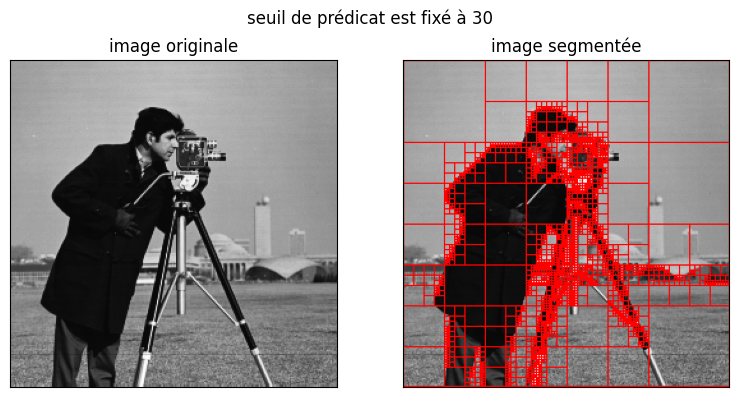

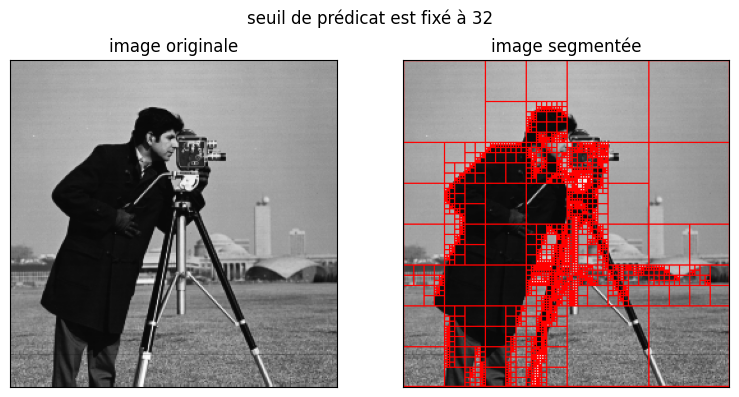

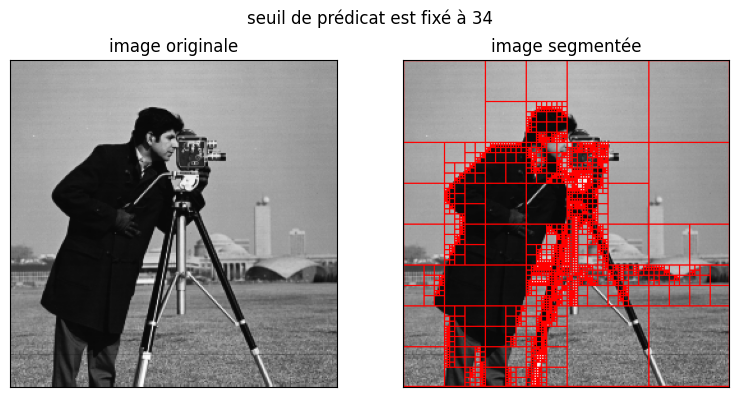

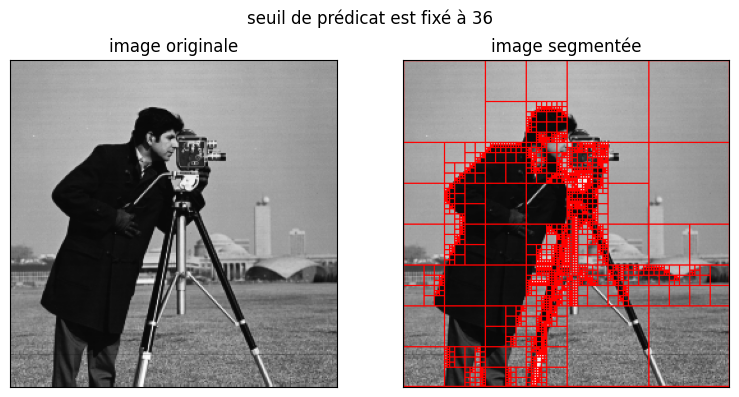

In [9]:
# cam = np.array(Image.open('img/cameraman.png'))
for i in [28,30,32,34,36]: # meilleure valeur aux alentours de 30-35? 32?
    drawRegions(listRegions(split(cam, (0,0,*cam.shape), predsplit, i, 1)), cam, True, f"seuil de prédicat est fixé à {i}")

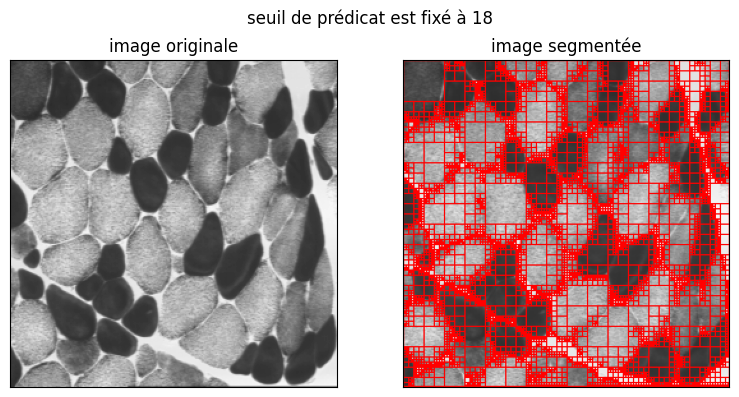

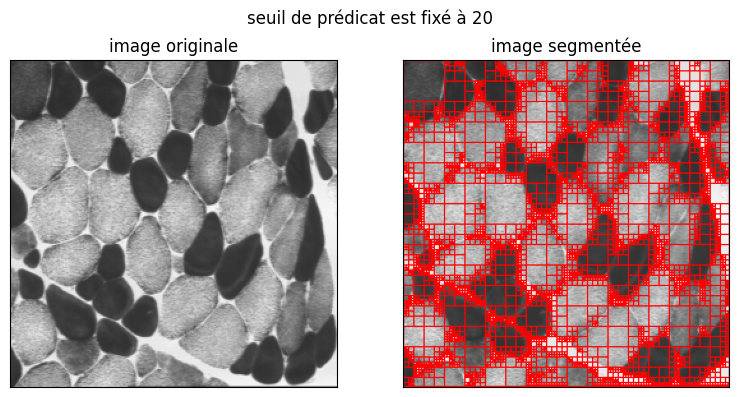

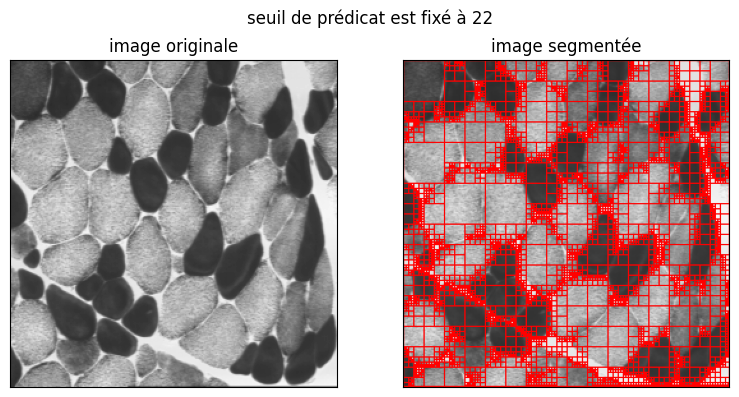

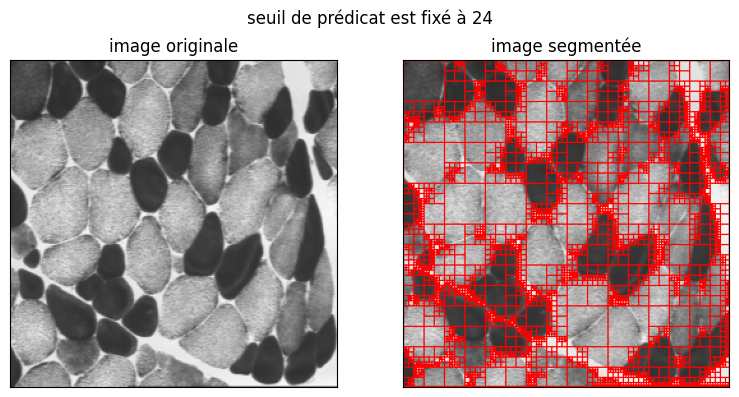

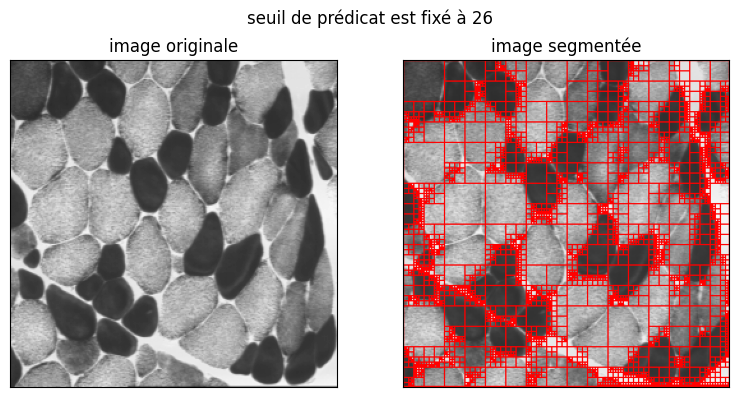

In [10]:
# muscle = np.array(Image.open('img/muscle.png'))
for i in [18,20,22,24,26]: # meilleure valeur aux alentours de 20-25?
    drawRegions(listRegions(split(muscle, (0,0,*muscle.shape), predsplit, i, 1)), muscle, True, f"seuil de prédicat est fixé à {i}")

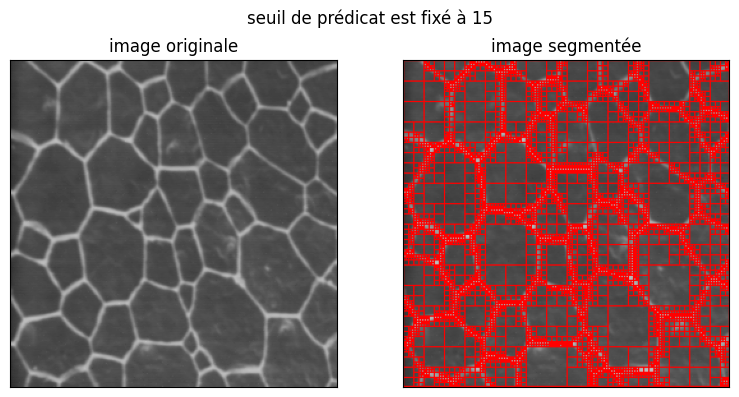

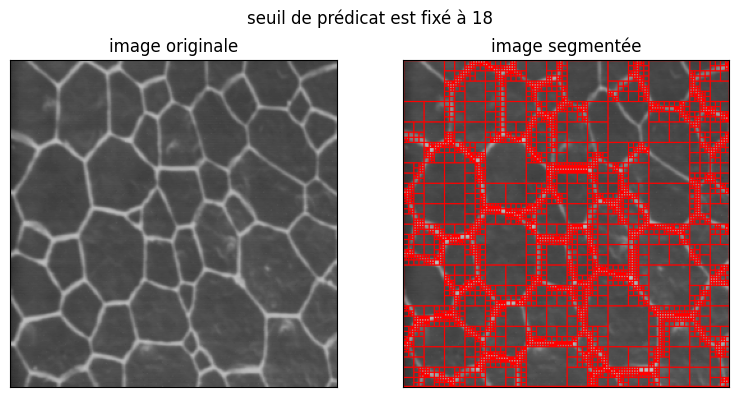

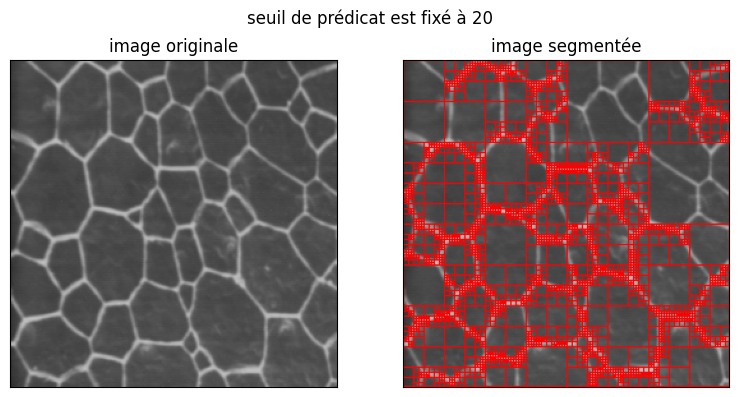

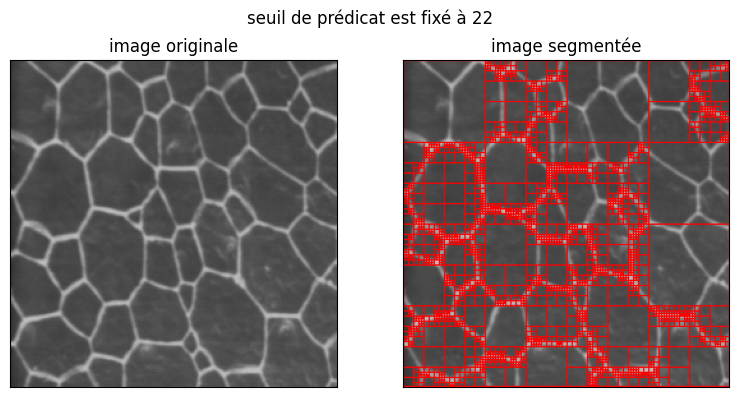

In [11]:
# prisme = np.array(Image.open('img/prisme.png'))
for i in [15,18,20,22]: # meilleure valeur aux alentours de 15-20?
    drawRegions(listRegions(split(prisme, (0,0,*prisme.shape), predsplit, i, 1)), prisme, True, f"seuil de prédicat est fixé à {i}")

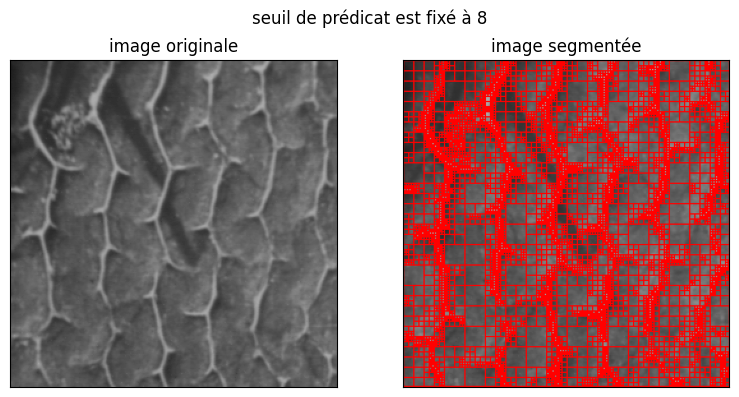

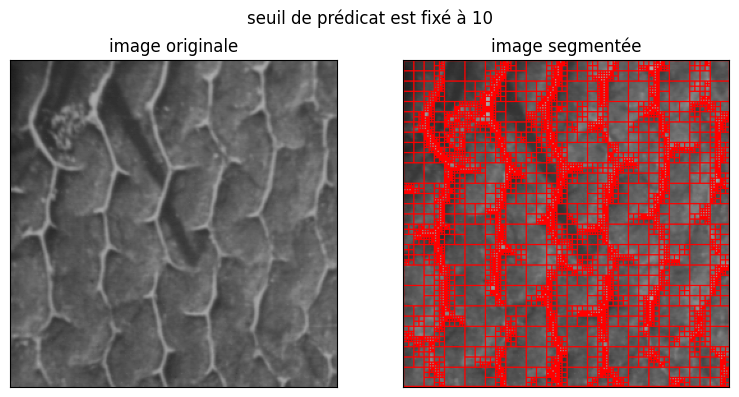

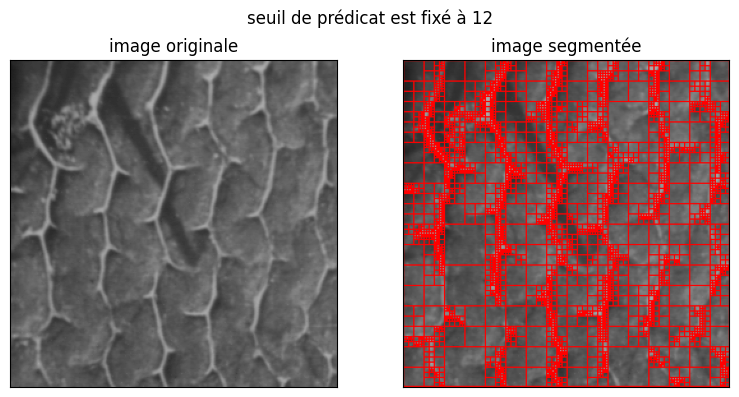

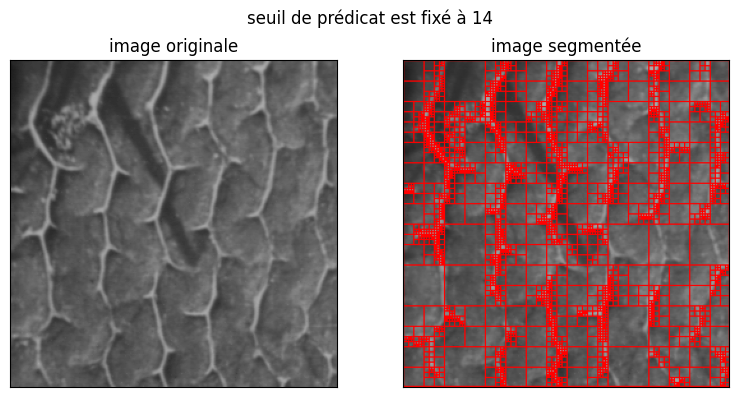

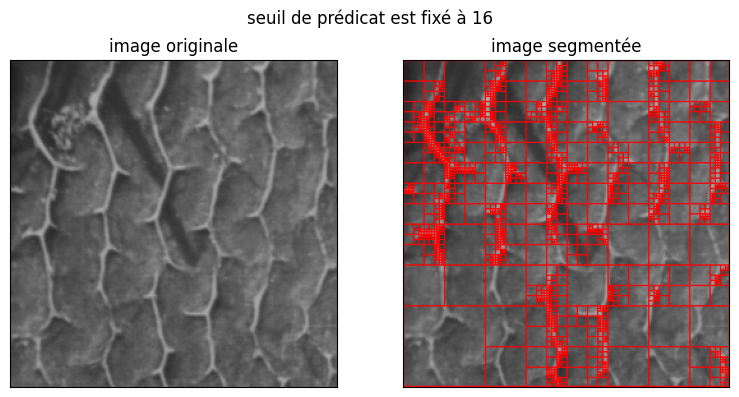

In [12]:
# seiche = np.array(Image.open('img/seiche.png'))
for i in [8,10,12,14,16]: # meilleure valeur aux alentours de 10-15?
    drawRegions(listRegions(split(seiche, (0,0,*seiche.shape), predsplit, i, 1)), seiche, True, f"seuil de prédicat est fixé à {i}")

## Exercise 3
### Question 1
Modify the function ``listRegions(L)`` to make it a function ``listRegionsStat(L,I)`` which computes the list of leaves of the quadtree ``L``. Each element of this list will be enriched with three scalar values: the first being the size, the second the mean and the third the variance of pixel values of the block in the image ``I``. This function then returns a list whose elements have the following formal type:
```python
type BlockStat = tuple[int**4,int,float**2]
```

The first four values are those of the ``Block`` type, the fifth is the size of the block (in number of pixels) and the last two values are the mean and variance calculated over the region.

In [13]:
# type BlockStat = tuple[int**4,int,float**2]

def listRegionsStat(L,I):
    """ QuadTree*Array -> list[BlockStat] """
    res = []
    if len(L) == 1:
        x,y,n,m = L[0]
        res = [(*L[0], n*m, np.mean(I[x:x+n,y:y+m]), np.std(I[x:x+n,y:y+m]))]
    else:
        for i in range(len(L)):
            res += listRegionsStat(L[i], I)
    return res

L = split(img_test, (0, 0, *img_test.shape), predsplit, 0, 1)
aval = listRegions(L)
dovom = listRegionsStat(L, img_test)

assert len(aval) == len(dovom)
for i in range(len(aval)):
    print(aval[i], dovom[i])


(0, 0, 32, 32) (0, 0, 32, 32, 1024, np.float64(150.0), np.float64(0.0))
(0, 32, 8, 8) (0, 32, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(0, 40, 8, 8) (0, 40, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(8, 32, 8, 8) (8, 32, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(8, 40, 8, 8) (8, 40, 8, 8, 64, np.float64(50.0), np.float64(0.0))
(0, 48, 8, 8) (0, 48, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(0, 56, 8, 8) (0, 56, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(8, 48, 8, 8) (8, 48, 8, 8, 64, np.float64(50.0), np.float64(0.0))
(8, 56, 8, 8) (8, 56, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(16, 32, 8, 8) (16, 32, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(16, 40, 8, 8) (16, 40, 8, 8, 64, np.float64(50.0), np.float64(0.0))
(24, 32, 8, 8) (24, 32, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(24, 40, 8, 8) (24, 40, 8, 8, 64, np.float64(150.0), np.float64(0.0))
(16, 48, 8, 8) (16, 48, 8, 8, 64, np.float64(50.0), np.float64(0.0))
(16, 56, 8, 8) (16, 56, 8, 8, 64, np.f

### Question 2
In the remainder, the formal type is considered:
```python
type Region = list[BlocStats]
```
A region, as seen during the tutorial work, is therefore a list of blocks. Write the predicate ``predmerge(b,R,*args)`` as seen in tutorial work. This function returns ``True`` if the ``b`` block should merge into the ``R`` region. If a merge happens, then the first item of ``R`` will have its statistics updated to describe the statistics of the region ``R`` merged with `b`.

Soit $R_1$ et $R_2$ deux régions distinctes tel que $R_1 \cap R_2 = \emptyset$ avec tailles $n_1$ et $n_2$, moyennes $\mu_1$ et $\mu_2$ et avec écart-type $\sigma_1$ et $\sigma_2$ : 
$$\left \{ \begin{array}{l}
     \displaystyle \mu = \frac{n_1\mu_1+n_2\mu_2}{n_1+n_2}\\
     \displaystyle \sigma^2 = \frac{n_1 (\sigma_1^2+\mu_1^2) + n_2(\sigma_2^2 + \mu_2^2)}{n_1+n_2} - \mu^2
\end{array} \right.$$

In [14]:
def predmerge(b,R,*args):
    """ BlocsStat*Region*... -> bool 
        If merge, R[0] is modified
    """
    x,y,w,h,n1,mu1,sig1 = R[0]
    n2,mu2,sig2 = b[4:]

    n = n1+n2
    mu = (n1 * mu1 + n2 * mu2) / n
    sig = np.sqrt(((sig1*sig1 + mu1*mu1)*n1 + (sig2*sig2 + mu2*mu2)*n2)/n - mu*mu)

    if sig <= args[0]:
        R[0] = x,y,w,h,n,mu,sig
        return True
    return False

### Question 3
Using `predmerge()` and `neighbors()` functions, given at the beginning of the notebook, write the function ``merge()`` discussed in tutorial work (exercise 7.6).

Recalls on Python lists:
- Remove an element `a` from a list `L`: `L.remove(a)`
- Test if `a` belongs to a list `L`: `a in L` 
- Iterate the elements of a list `L`: `for a in L:`
- Access to an element of a list: as with numpy arrays

In [15]:
def merge(S,I,pred,*args):
    """ QuadTree*Array*(BlockStat*Region*...->bool) -> list[Region]
        Merge the leaves of S in a list of regions
    """
    K = listRegionsStat(S, I) # feuilles
    L = []
    while K != []:
        b = K[0]
        K = K[1:]
        R = [b]
        N = neighbors(b, K)
        while N != []:
            bn = N[0]
            N = N[1:]
            if pred(bn, R, *args) and bn in K:
                R.append(bn)
                K.remove(bn)
                N += [n for n in neighbors(bn, K) if n not in N]
        L.append(R)
    return L

    

### Question 4
Test the previous functions using the synthetic image `img_test`. In particular, check that merge() returns a list of 3 elements (i.e. 3 regions).

In [16]:
M = merge(split(img_test, (0, 0, *img_test.shape), predsplit, 0, 1), img_test, predmerge, 0)
# Unit test: M is the list of merged blocs returned by merge()
print(M[1])
assert len(M) == 3
print("OK")

[(8, 40, 8, 8, 256, np.float64(50.0), np.float64(0.0)), (8, 48, 8, 8, 64, np.float64(50.0), np.float64(0.0)), (16, 40, 8, 8, 64, np.float64(50.0), np.float64(0.0)), (16, 48, 8, 8, 64, np.float64(50.0), np.float64(0.0))]
OK


### Question 5
Write a function ``regions(LR,shape)`` that takes as arguments a list of regions (such as returned by the function ``merge()``) and an image size, and returns an image of the regions. Each region will be colored with the gray level corresponding to the average of the region. You also can assign random colors to each region to clearly distinguish adjacent regions. The ``shape`` parameter gives the size of the image to be reconstructed. 

Test the function on the previous example.

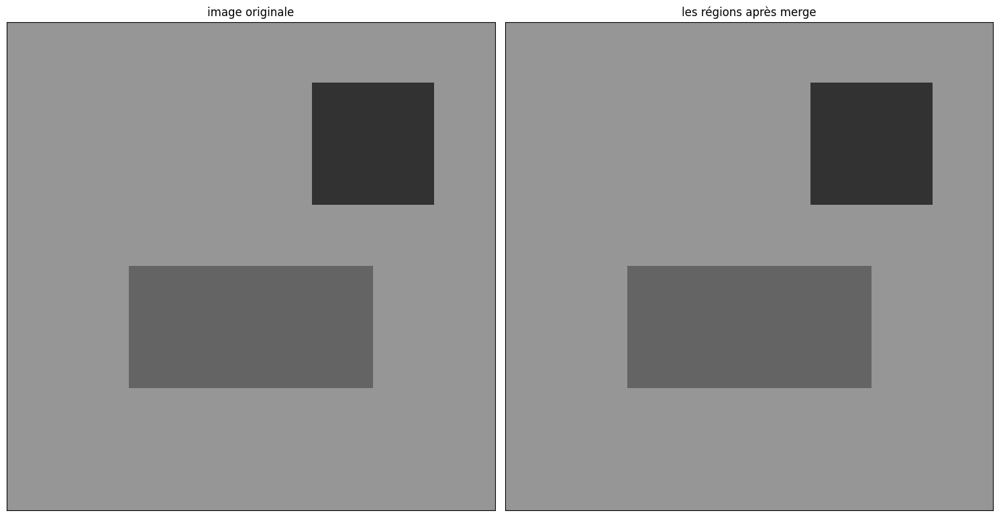

In [17]:
def regions(LR,shape):
    """ list[Region]*tuple[int,int] -> Array """
    img = np.zeros(shape)
    for R in LR:
        for b in R:
            x,y,w,h,_,mu,_ = b
            img[x:x+w,y:y+h] = mu   
    return img

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))
ax[0].imshow(img_test, vmin=0, vmax=255, cmap="gray")
ax[0].set_title("image originale")
ax[0].set_xticks(())
ax[0].set_yticks(())

ax[1].imshow(regions(M, img_test.shape), vmin=0, vmax=255, cmap="gray")
ax[1].set_title("les régions après merge")
ax[1].set_xticks(())
ax[1].set_yticks(())
fig.tight_layout()
plt.show()

## Exercise 4: experiments
### Question 1
Test the function ``merge()`` on the images ``angio``, ``cam``, ``muscle``, ``prisme`` and ``seiche``. Try to produce the best segmentations.

In [18]:
def drawRegionsMerge(I, LR, verbose=True, fig_title="", img1_title="image originale", img2_title="image segmentée", figsize=(8, 4)):
    res = regions(LR, I.shape)
    if verbose:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
        fig.suptitle(fig_title)
        ax[0].imshow(I, vmin=0, vmax=255, cmap="gray")
        ax[0].set_title(img1_title)
        ax[0].set_xticks(())
        ax[0].set_yticks(())
        ax[1].imshow(res, vmin=0, vmax=255, cmap="gray")
        ax[1].set_title(img2_title)
        ax[1].set_xticks(())
        ax[1].set_yticks(())
        fig.tight_layout()
        plt.show()
    return res
    

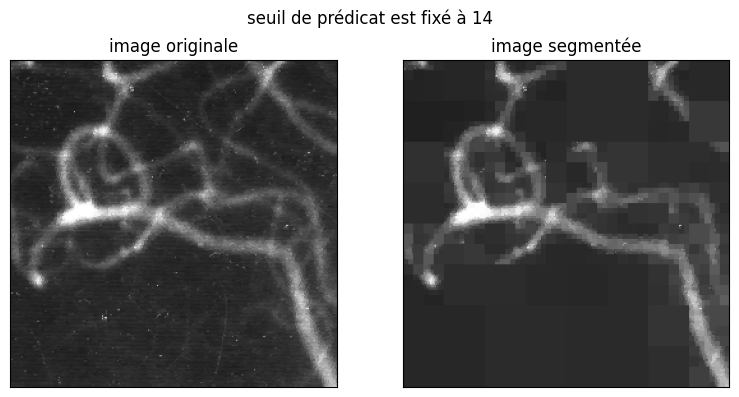

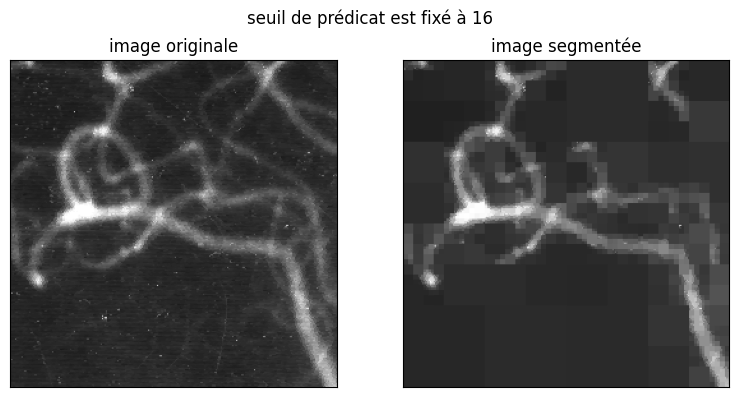

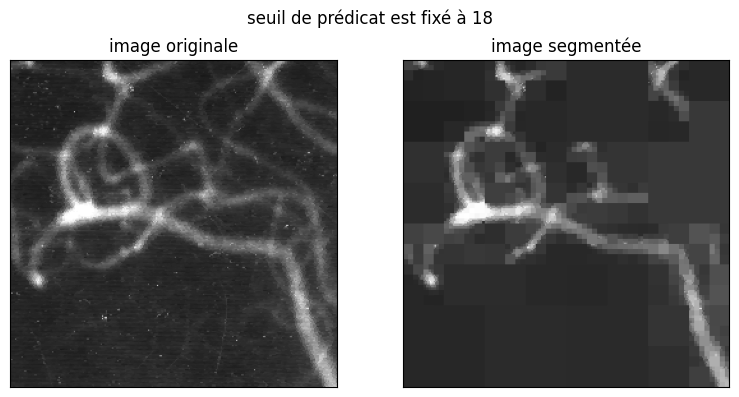

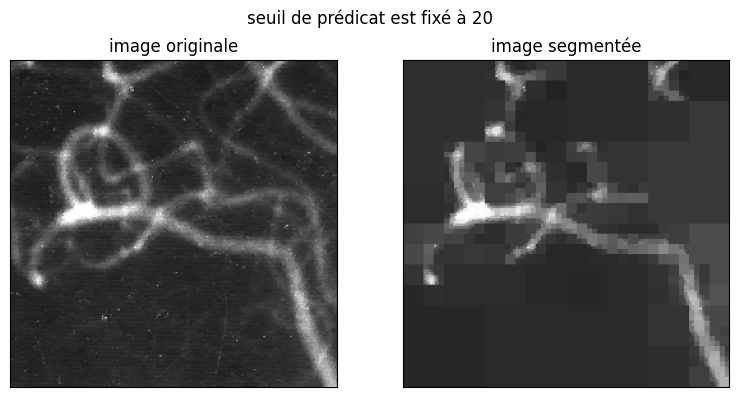

In [19]:
# angio
for i in [14,16,18,20]:
    Langio = split(angio, (0,0,*angio.shape), predsplit, i, 1)
    Mangio = merge(Langio, angio, predmerge, i)
    drawRegionsMerge(angio, Mangio, fig_title=f"seuil de prédicat est fixé à {i}")


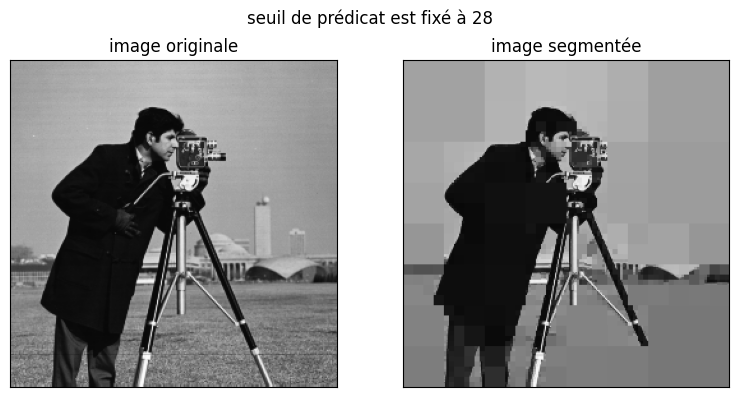

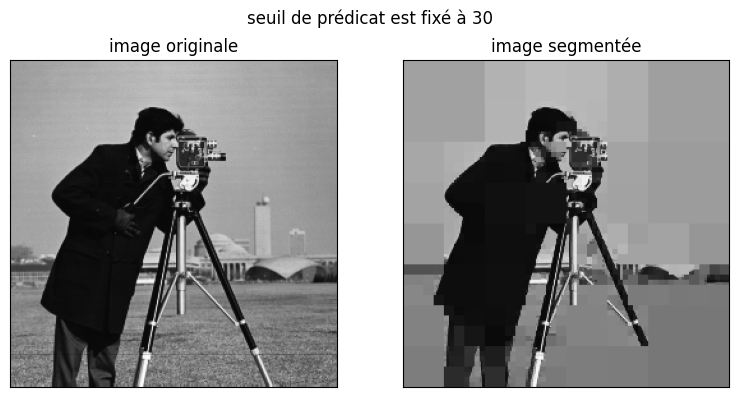

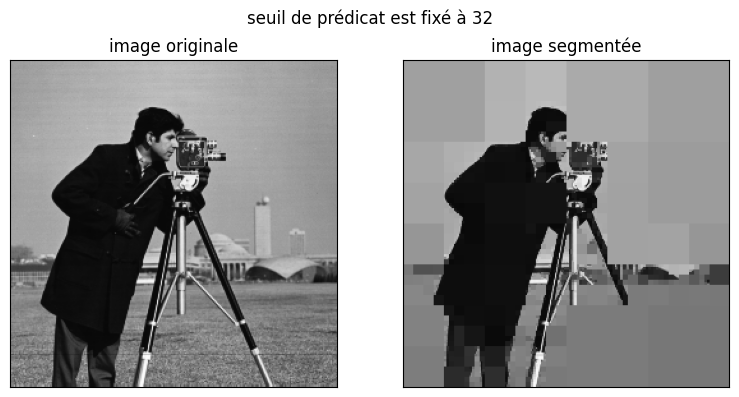

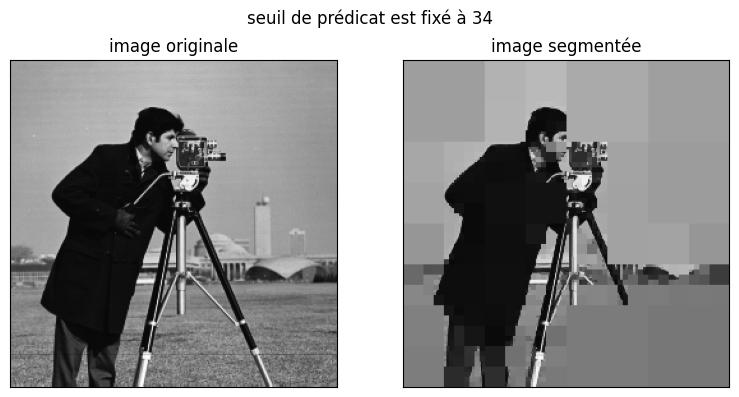

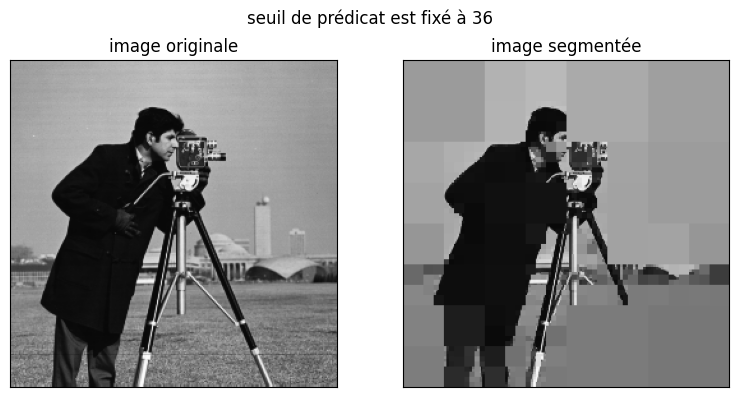

In [20]:
# cam
for i in [28,30,32,34,36]:
    Lcam = split(cam, (0,0,*cam.shape), predsplit, i, 1)
    Mcam = merge(Lcam, cam, predmerge, i)
    drawRegionsMerge(cam, Mcam, fig_title=f"seuil de prédicat est fixé à {i}")

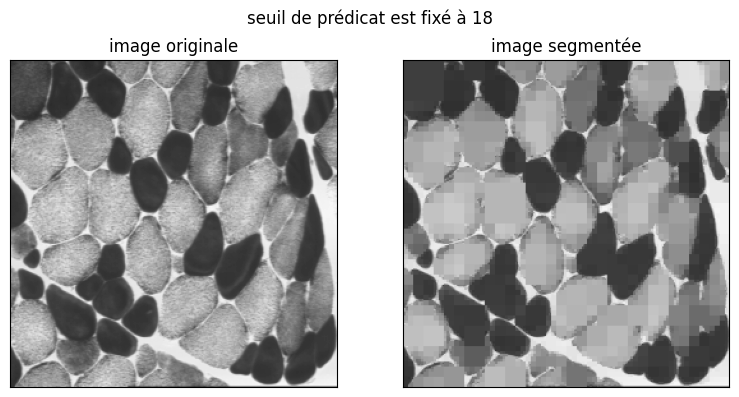

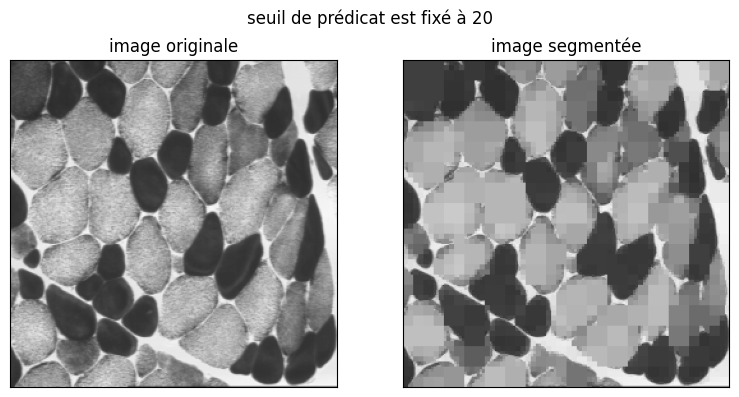

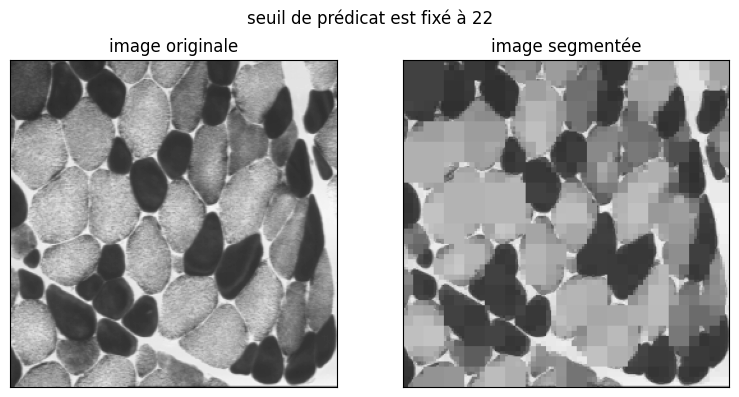

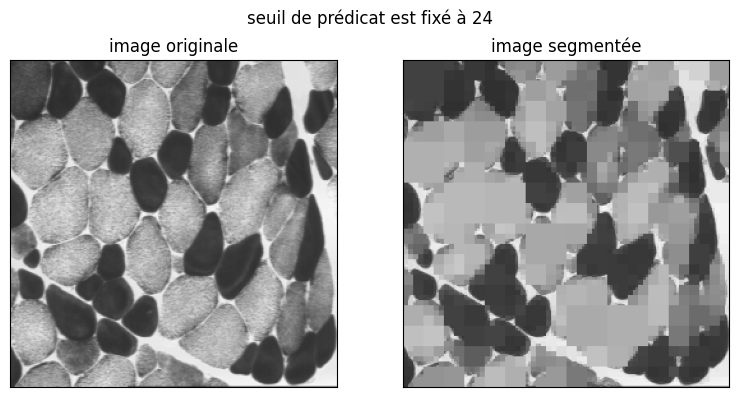

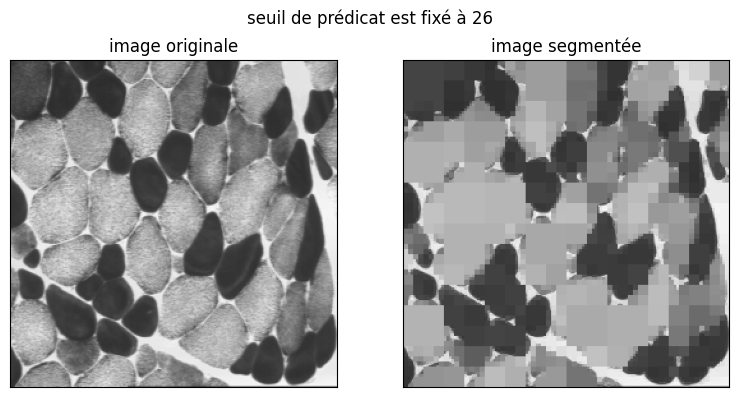

In [21]:
# muscle
for i in [18,20,22,24,26]:
    Lmuscle = split(muscle, (0,0,*muscle.shape), predsplit, i, 1)
    Mmuscle = merge(Lmuscle, muscle, predmerge, i)
    drawRegionsMerge(muscle, Mmuscle, fig_title=f"seuil de prédicat est fixé à {i}")

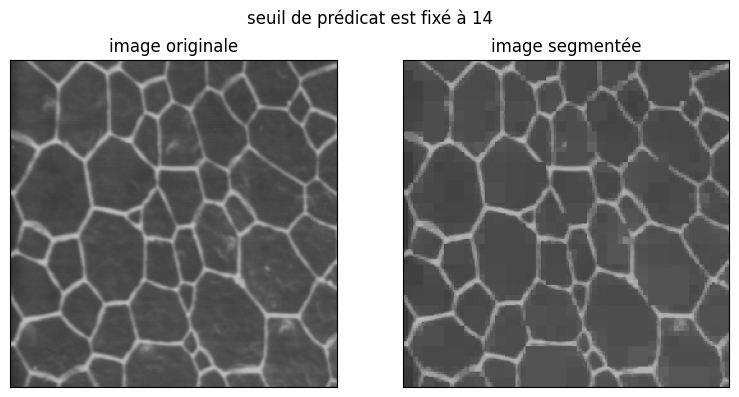

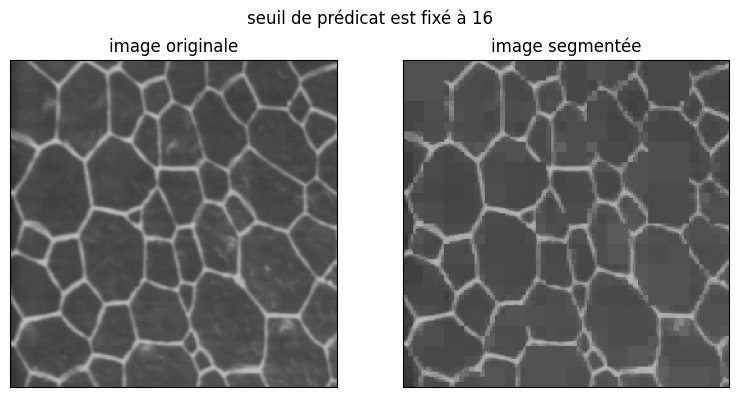

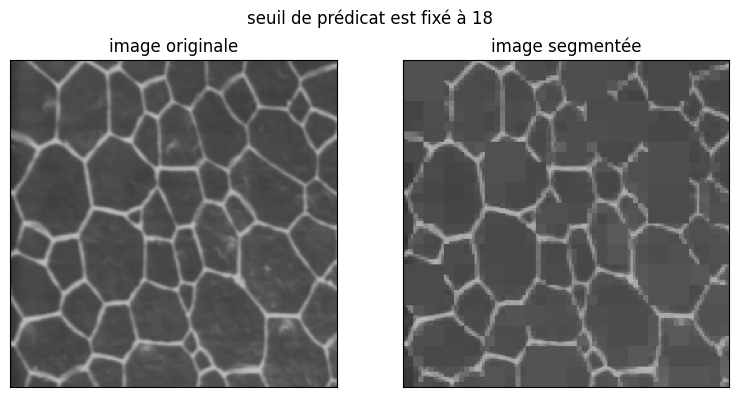

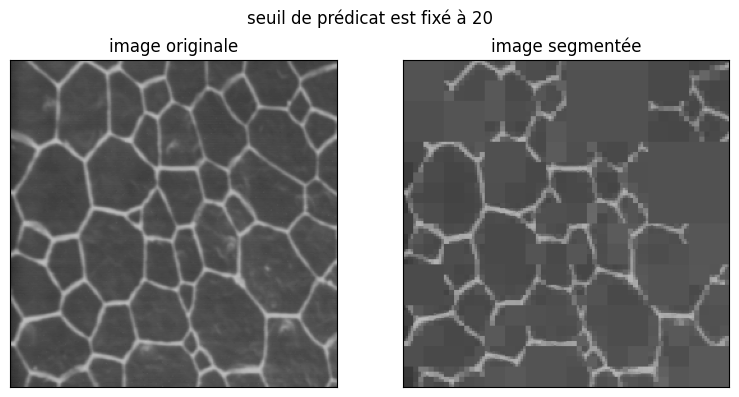

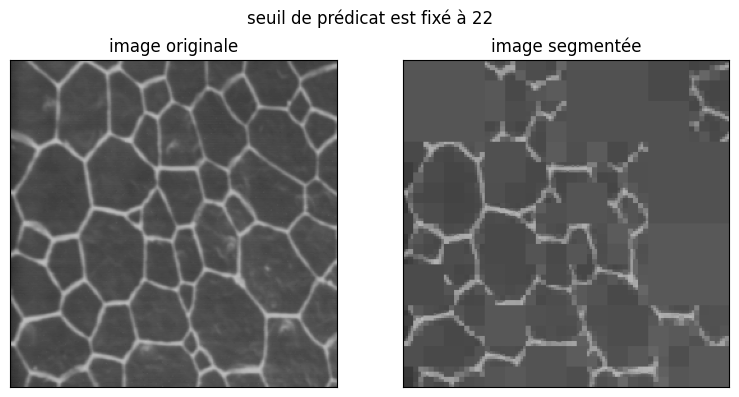

In [22]:
# prisme
for i in [14,16,18,20,22]:
    Lprisme = split(prisme, (0,0,*prisme.shape), predsplit, i, 1)
    Mprisme = merge(Lprisme, prisme, predmerge, i)
    drawRegionsMerge(prisme, Mprisme, fig_title=f"seuil de prédicat est fixé à {i}")

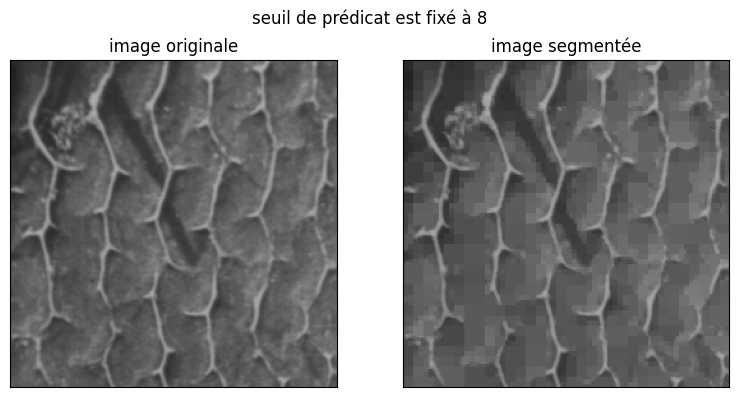

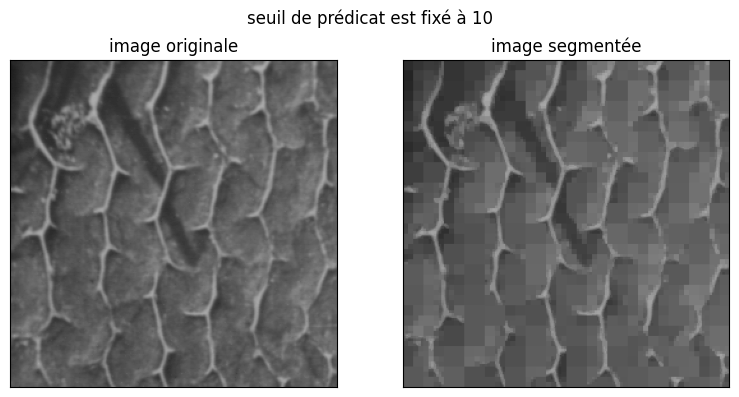

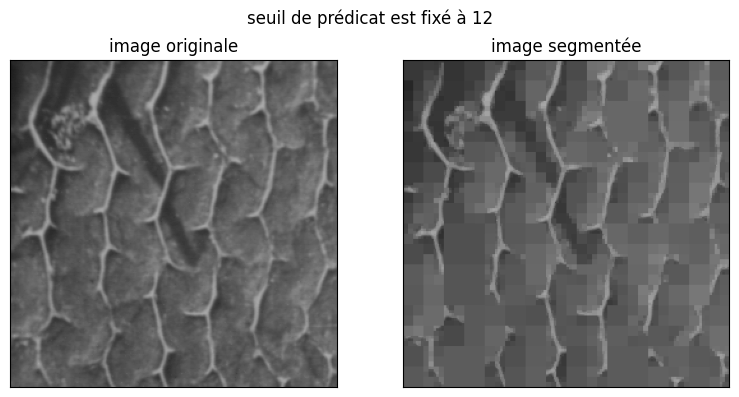

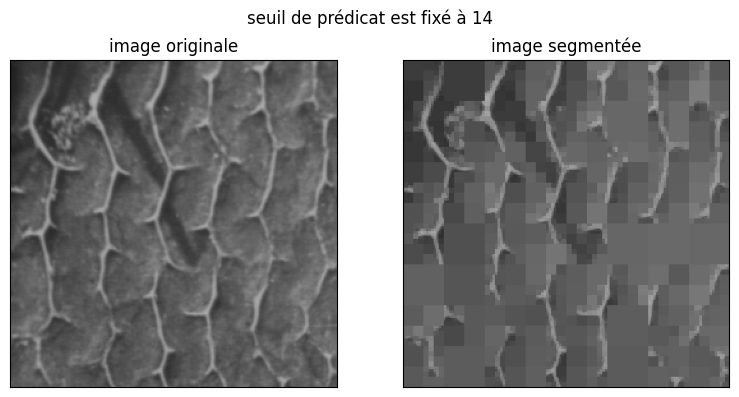

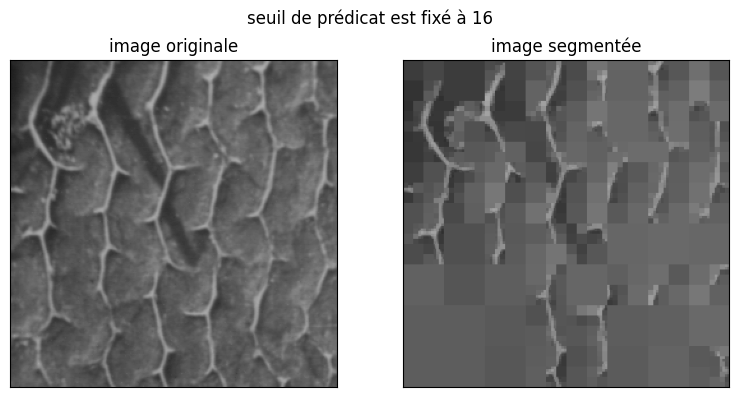

In [23]:
# seiche
for i in [8,10,12,14,16]:
    Lseiche = split(seiche, (0,0,*seiche.shape), predsplit, i, 1)
    Mseiche = merge(Lseiche, seiche, predmerge, i)
    drawRegionsMerge(seiche, Mseiche, fig_title=f"seuil de prédicat est fixé à {i}")

D'après ces tests, nous voyons que les valeurs de seuil choisies pour chaque image dans les questions précédentes sont en effet déterminées en fonction d'un compromis entre la précision et un nombre minimal de régions. En effet, ce seuil peut différer en fonction de l'information que nous cherchons à extraire de l'image. Si nous avons besoin de plus de précision, il faut explorer les valeurs de seuil plus petites, et dans le cas où nous souhaitons moins de détails, il faut envisager des valeurs de seuil plus grandes.

### Question 2
The result of the merge algorithm highly depends on how you visit the regions. One can then sort the leaves of the quadtree, for example, from the smallest to the largest blocks, or the opposite (use the Python function ``sorted()``). 
The same question arises when calculating the set of neighbors of the merged region. Should they be sorted? If yes, according to which criteria? their size? their proximity? 
Obviously there is no universal answer but it should be adapted to each type of problem. 
Do some tests to see the influence of these sortings on the result of the merger.

Pour chaque région (type ```blockStat```) nous disposons de trois statistiques : la taille, la moyenne et l'écart-type de la région. Pour chaque image, nous testons l'effet de chacune de ces statistiques sur le merge, en utilisant pour cela l'ordre croissant ou décroissant.

In [31]:
def merge_sorted_leaves(S, I, pred, sort_func, reverse, *args):
    K_unordered = listRegionsStat(S, I) # feuilles
    K = sorted(K_unordered, key=sort_func, reverse=reverse)
    L = []
    while K != []:
        b = K[0]
        K = K[1:]
        R = [b]
        N = neighbors(b, K)
        while N != []:
            bn = N[0]
            N = N[1:]
            if pred(bn, R, *args) and bn in K:
                R.append(bn)
                K.remove(bn)
                N += [n for n in neighbors(bn, K) if n not in N]
        L.append(R)
    return L

def merge_sorted_neighbours(S, I, pred, sort_func, reverse, *args):
    K = listRegionsStat(S, I) # feuilles
    L = []
    while K != []:
        b = K[0]
        K = K[1:]
        R = [b]
        N = neighbors(b, K)
        N = sorted(N, key=sort_func, reverse=reverse)
        while N != []:
            bn = N[0]
            N = N[1:]
            if pred(bn, R, *args) and bn in K:
                R.append(bn)
                K.remove(bn)
                N += [n for n in neighbors(bn, K) if n not in N]
                N = sorted(N, key=sort_func, reverse=reverse)
        L.append(R)
    return L

def test_mergeNsort(I, sort_func, reverse, fig_title, *args):
    L = split(I, (0,0,*I.shape), predsplit, *args)
    r1 = regions(merge(L, I, predmerge, *args), I.shape)
    r2 = regions(merge_sorted_leaves(L, I, predmerge, sort_func, reverse, *args), I.shape)
    r3 = regions(merge_sorted_neighbours(L, I, predmerge, sort_func, reverse, *args), I.shape)

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10,5))
    fig.suptitle("critère de tri : " + fig_title)
    
    ax[0].imshow(r1, vmin=0, vmax=255, cmap="gray")
    ax[0].set_title(f"merge, regions : {len(r1)}")
    ax[0].set_xticks(())
    ax[0].set_yticks(())

    ax[1].imshow(r2, vmin=0, vmax=255, cmap="gray")
    ax[1].set_title(f"leaves sort + merge, regions : {len(r2)}")
    ax[1].set_xticks(())
    ax[1].set_yticks(())

    ax[2].imshow(r3, vmin=0, vmax=255, cmap="gray")
    ax[2].set_title(f"neighbours sort + merge, regions : {len(r3)}")
    ax[2].set_xticks(())
    ax[2].set_yticks(())

    fig.tight_layout()
    plt.show()

def test(I, *args):
    test_mergeNsort(I, lambda b: b[4], False, "taille de la région, croissane", *args)
    test_mergeNsort(I, lambda b: b[4], True, "taille de la région, décroissante", *args)

    test_mergeNsort(I, lambda b: b[5], False, "moyenne de la région, croissante", *args)
    test_mergeNsort(I, lambda b: b[5], True, "moyenne de la région, décroissante", *args)

    test_mergeNsort(I, lambda b: b[5], False, "écart-type de la région, croissante", *args)
    test_mergeNsort(I, lambda b: b[5], True, "écart-type de la région, décroissante", *args)

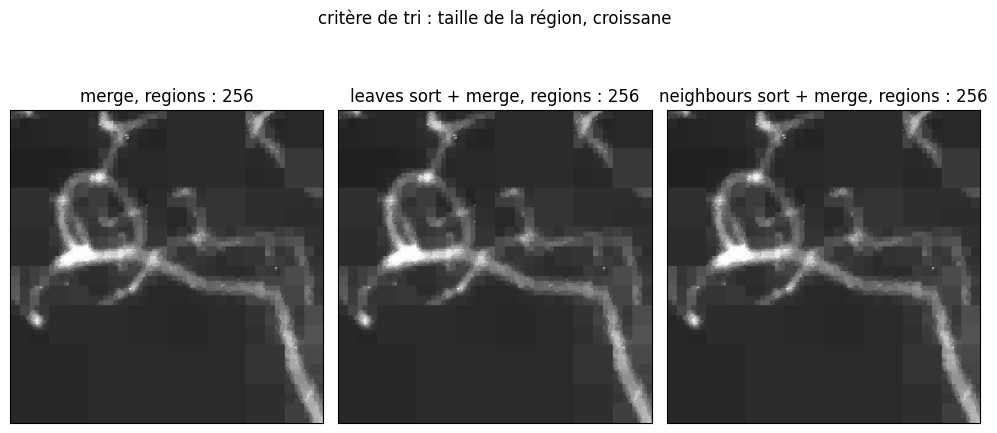

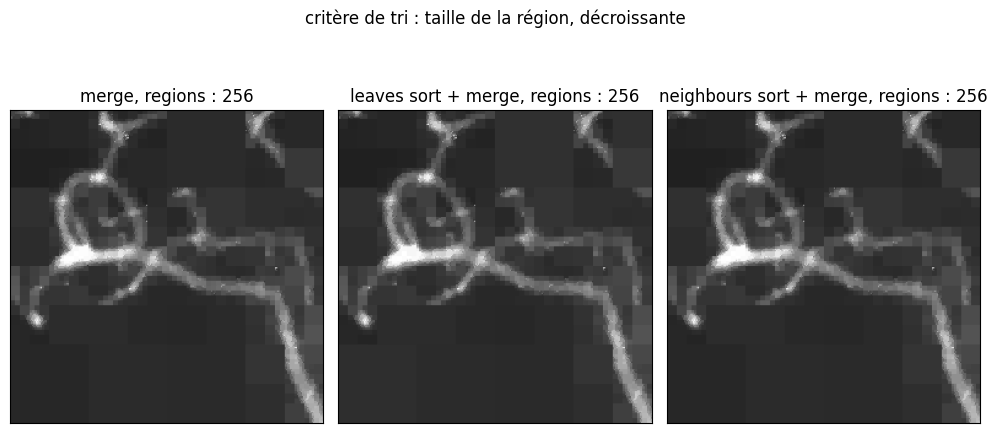

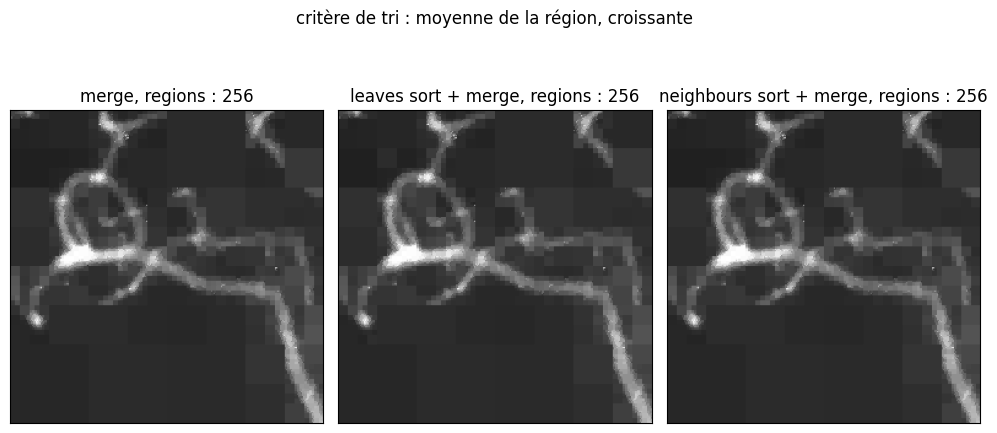

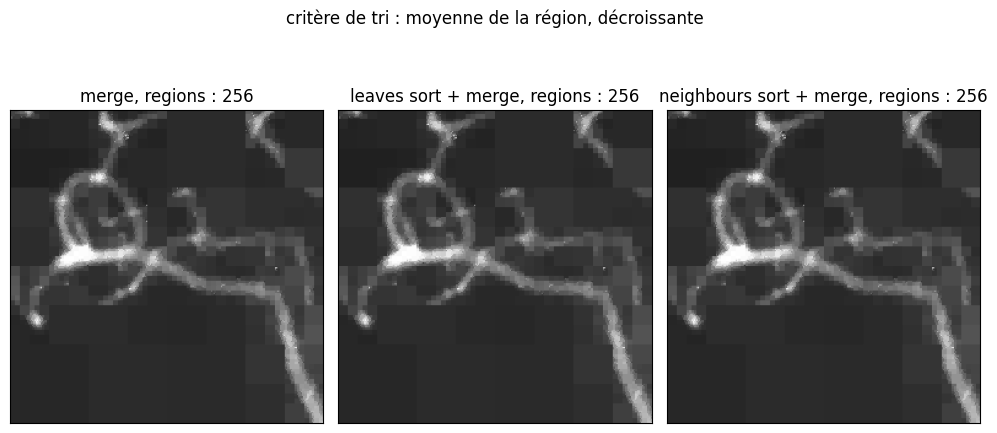

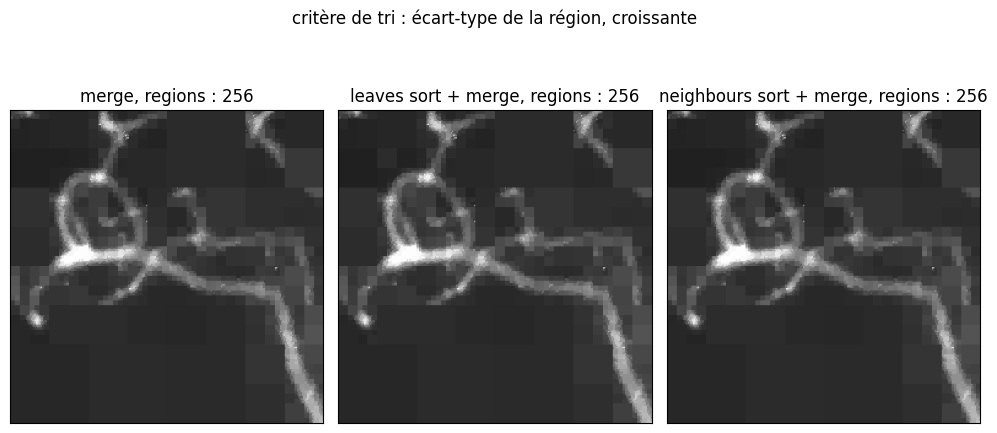

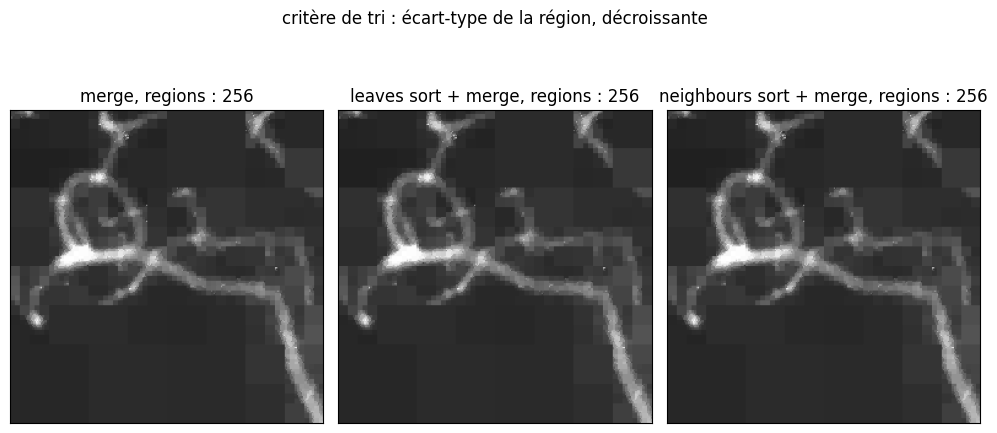

In [32]:
# image angio, ordre croissant, critère de tri : la taille de la région
test(angio, 15, 1)

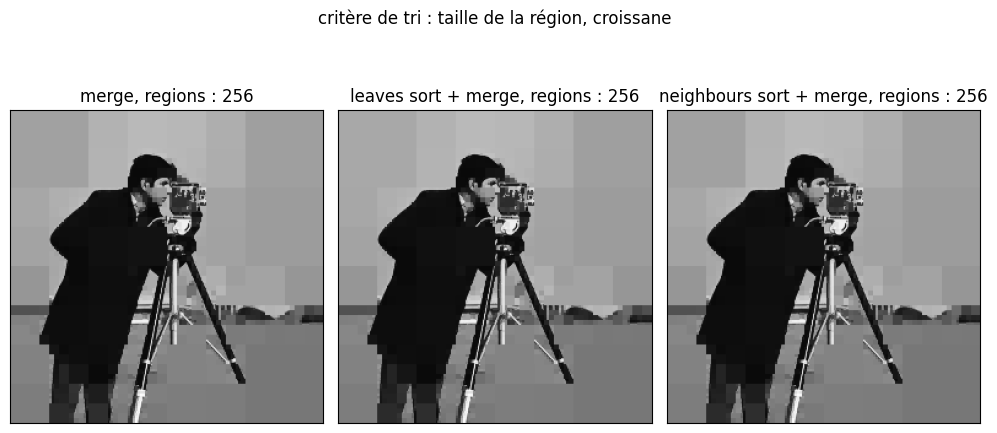

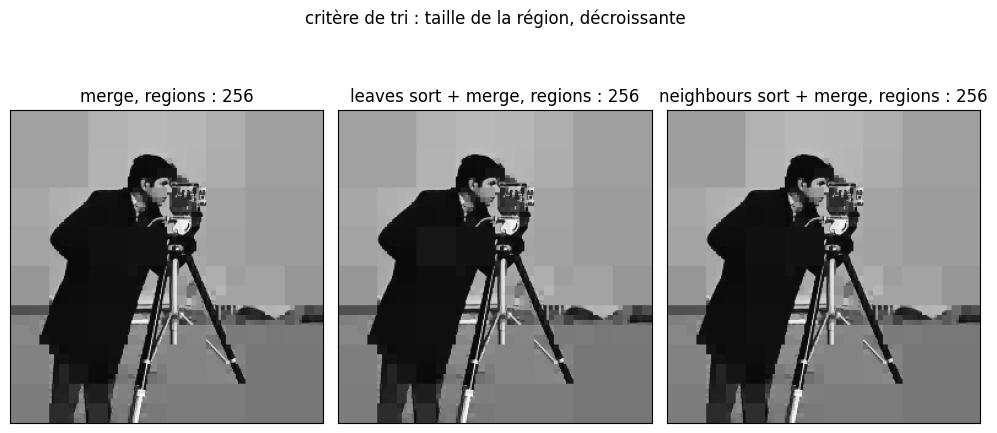

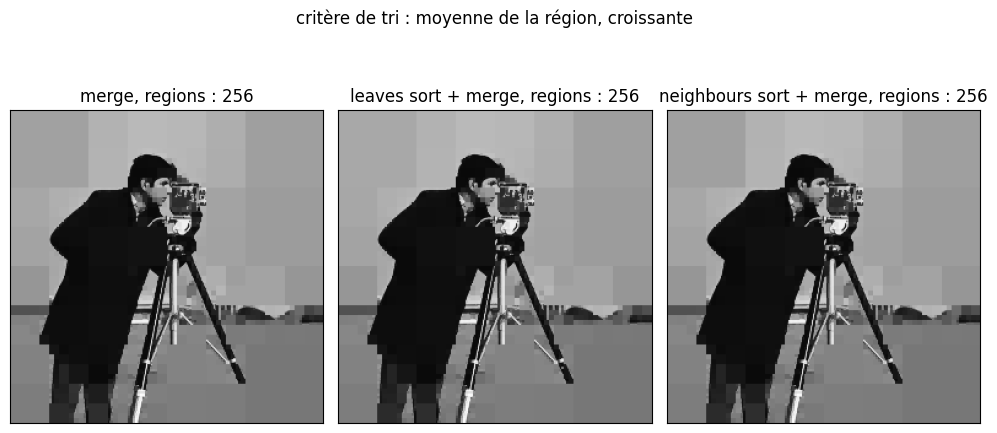

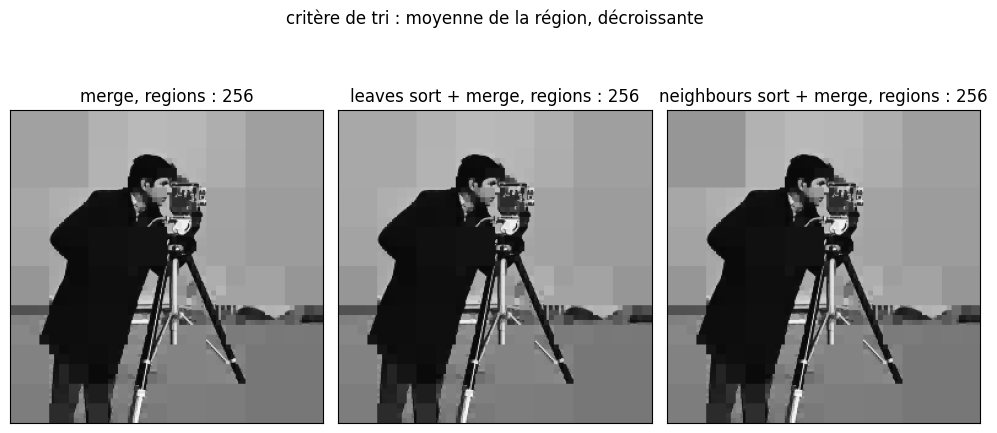

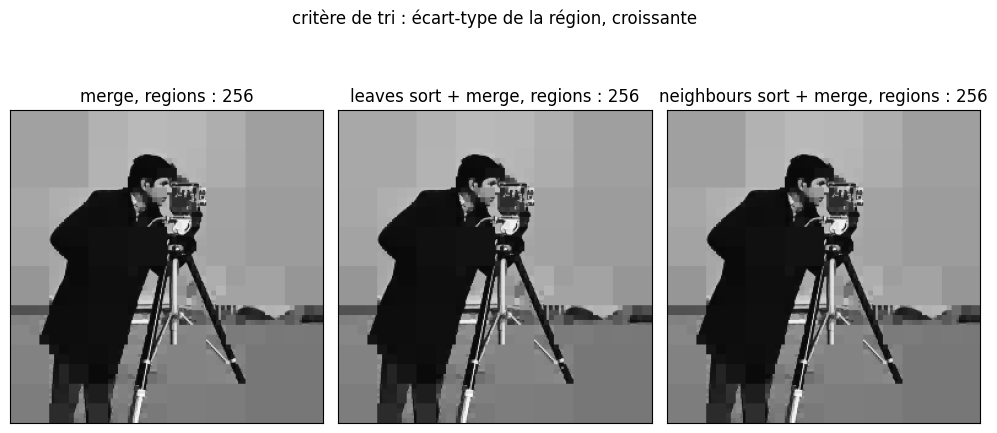

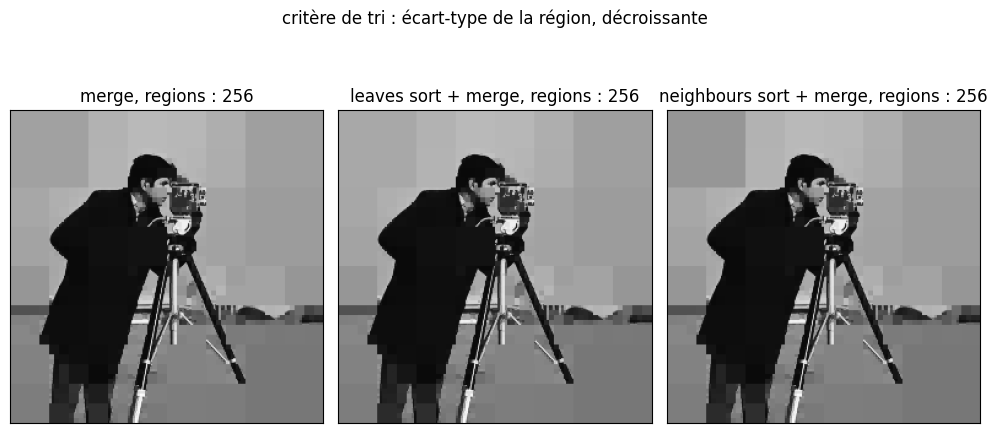

In [33]:
# cam
test(cam, 30, 1)

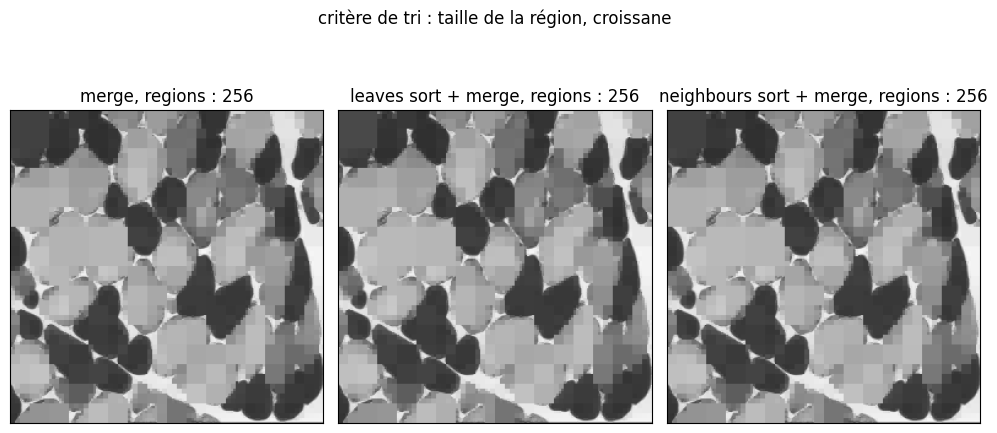

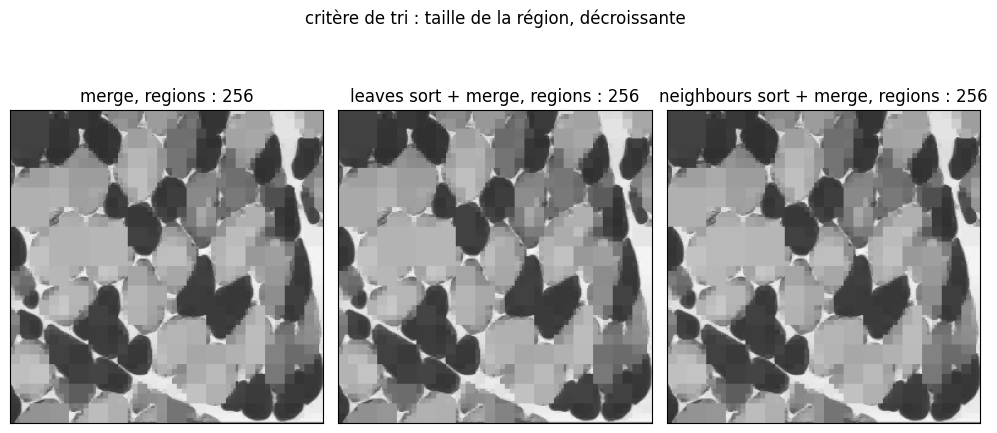

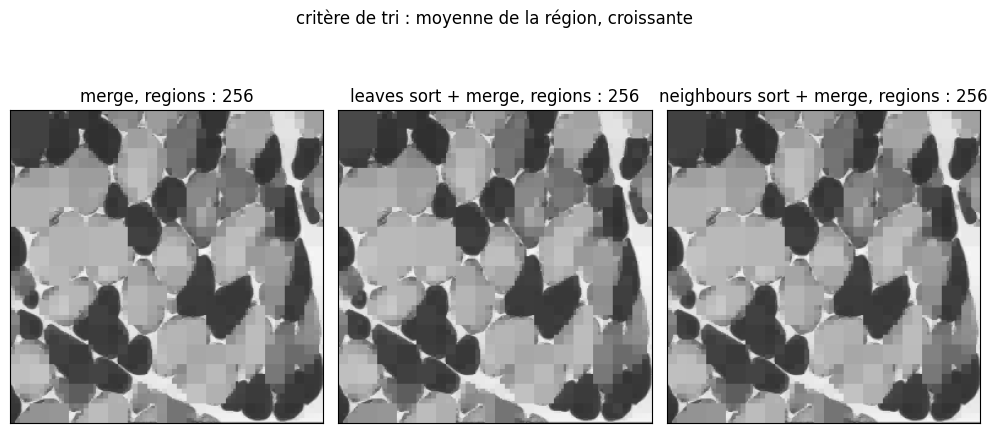

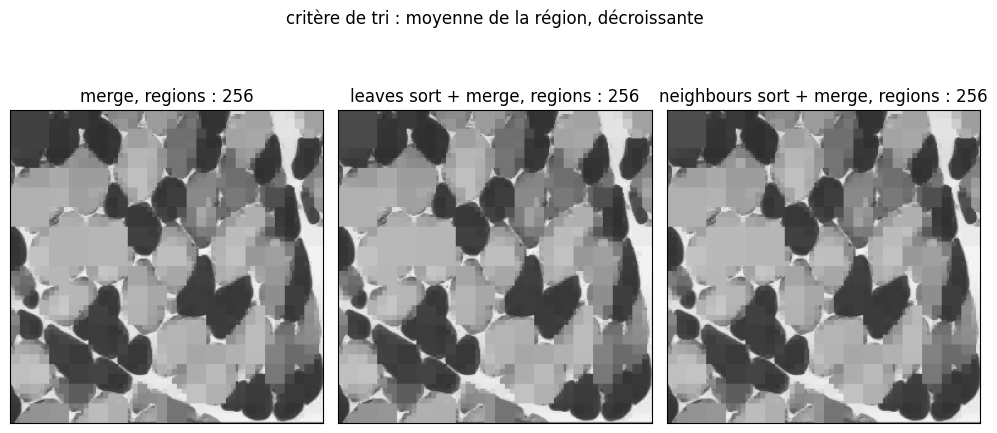

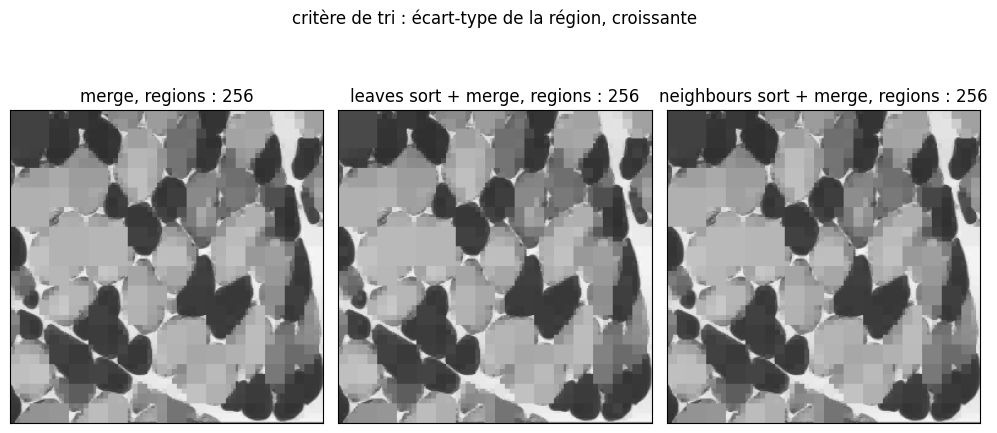

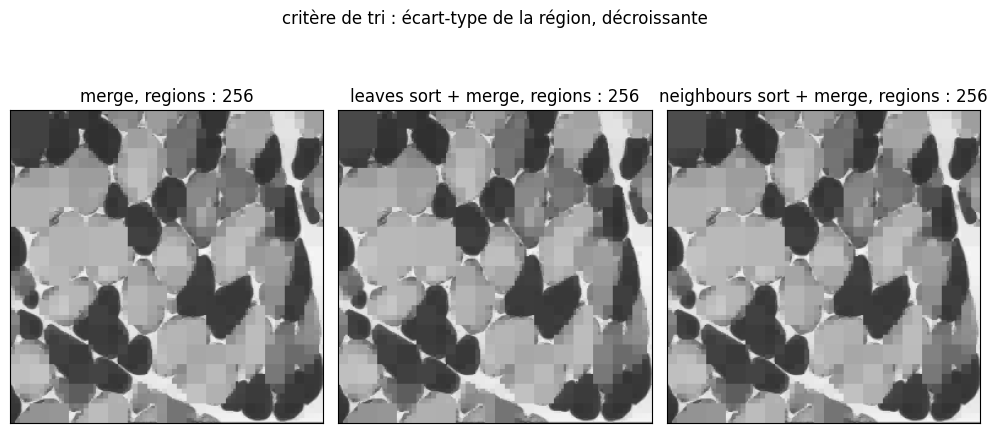

In [34]:
# muscle
test(muscle, 22, 1)

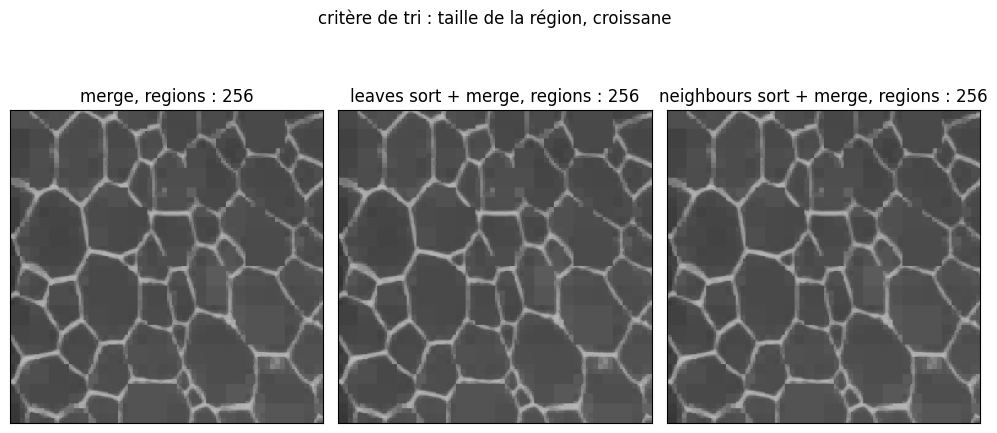

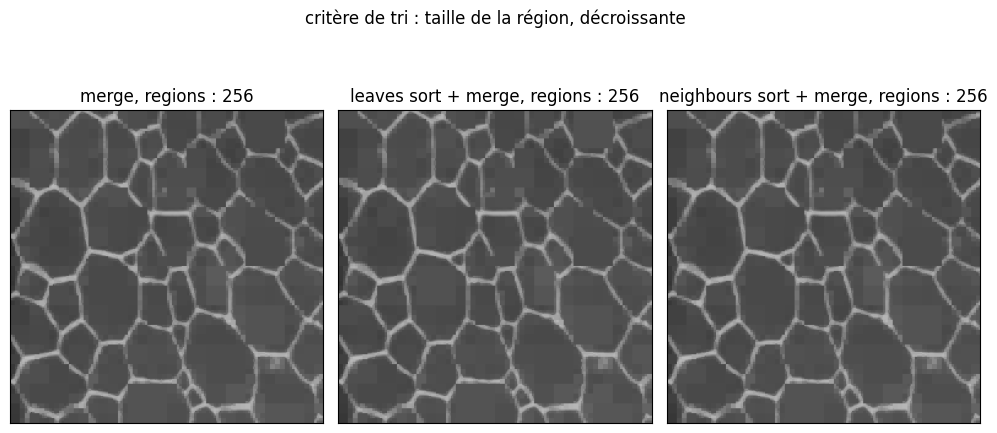

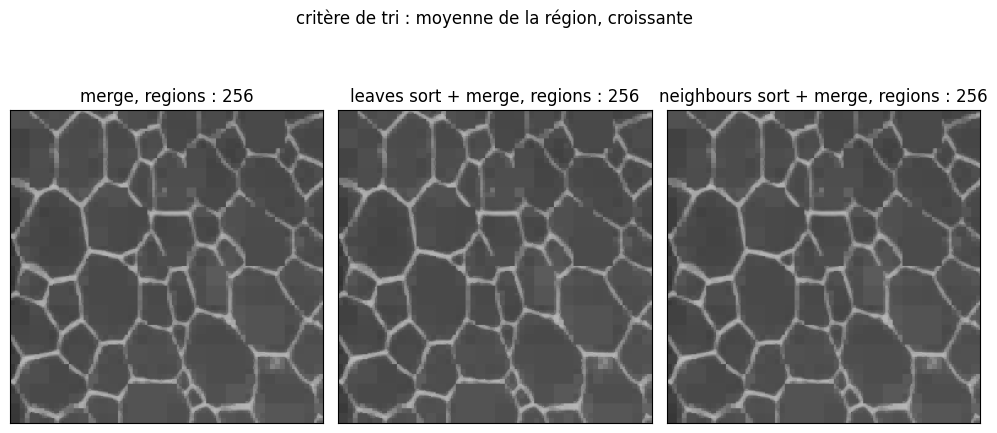

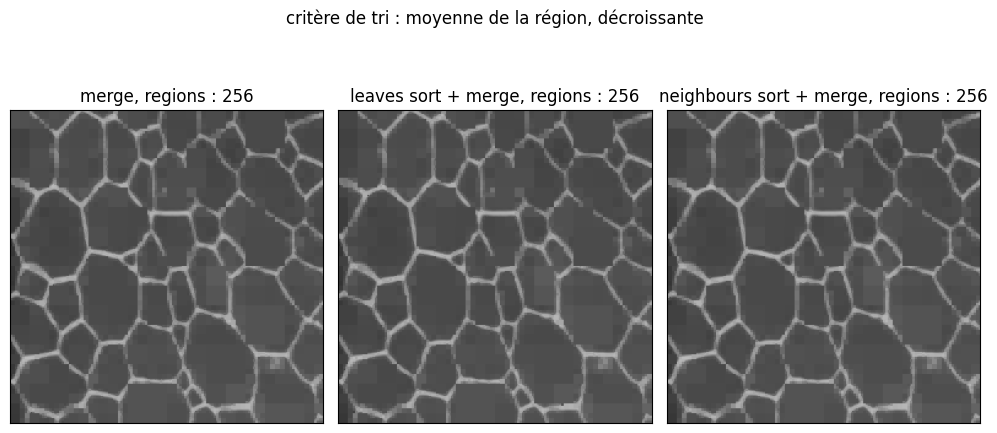

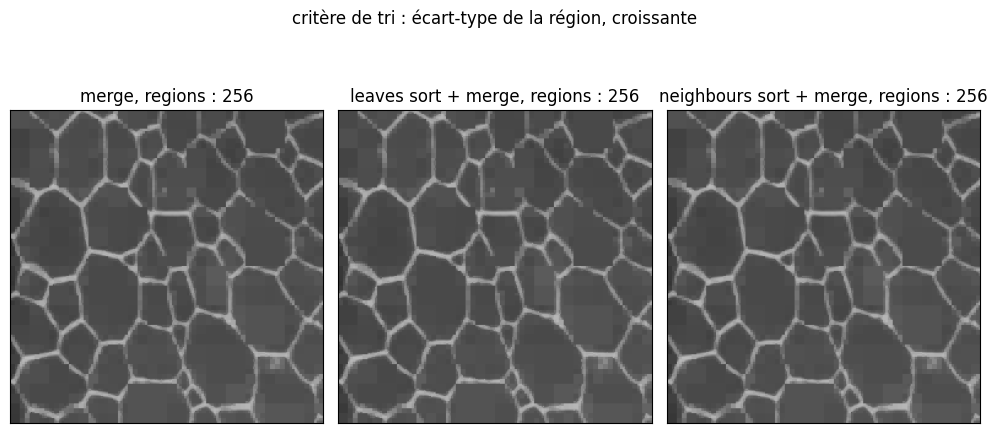

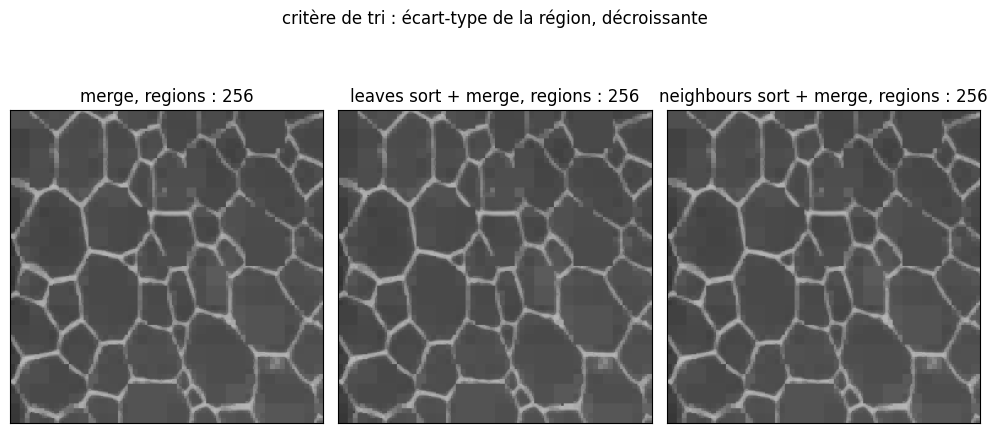

In [35]:
# prisme
test(prisme, 15, 1)

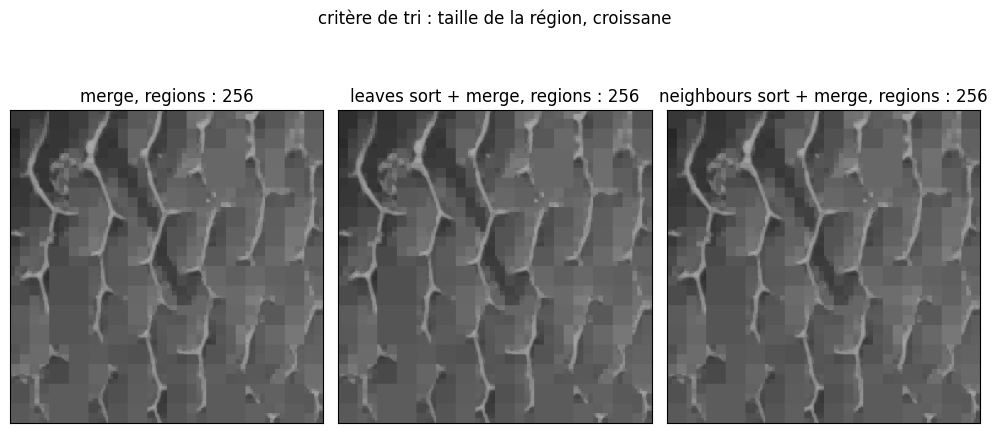

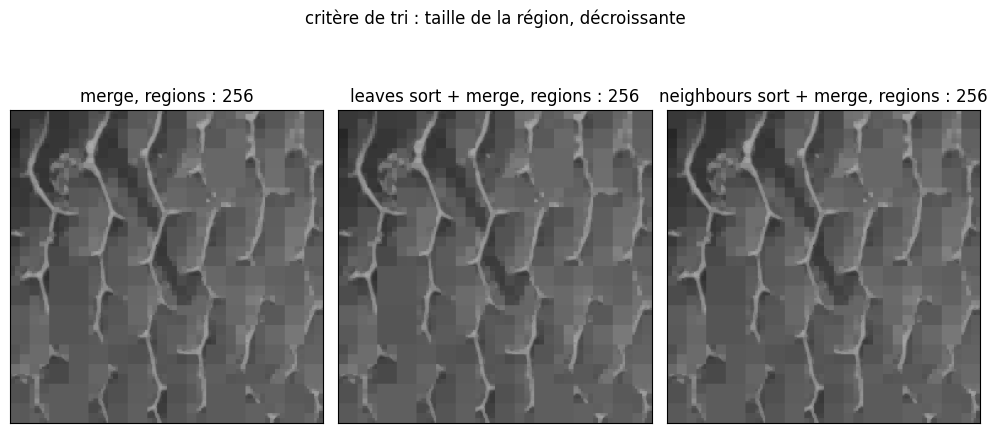

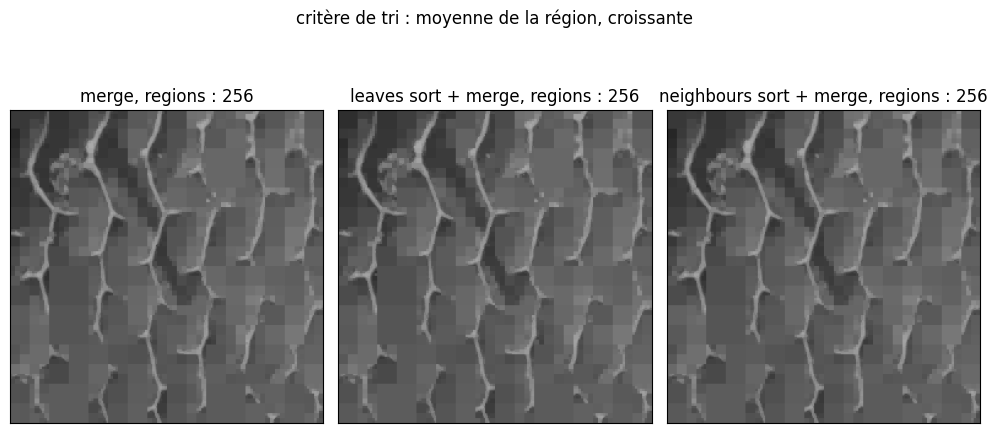

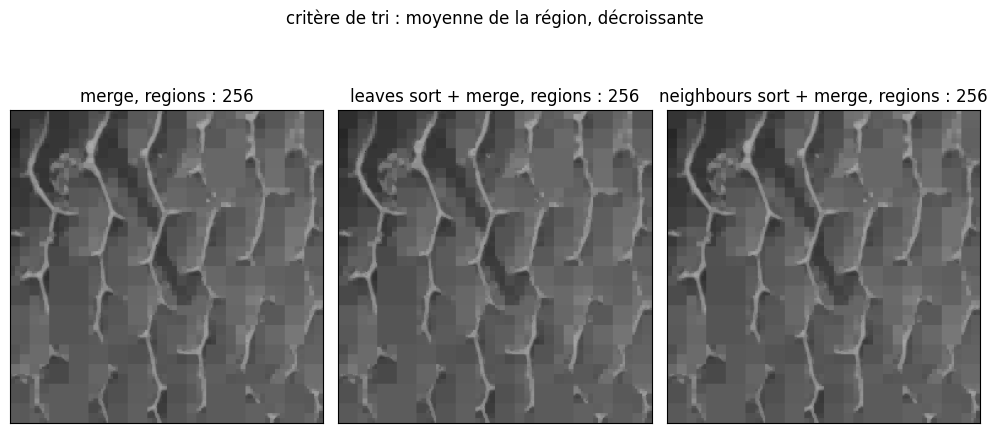

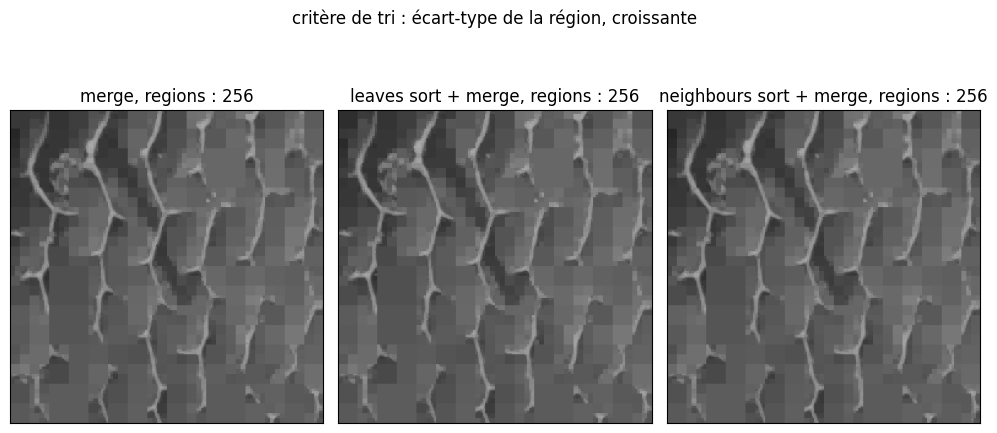

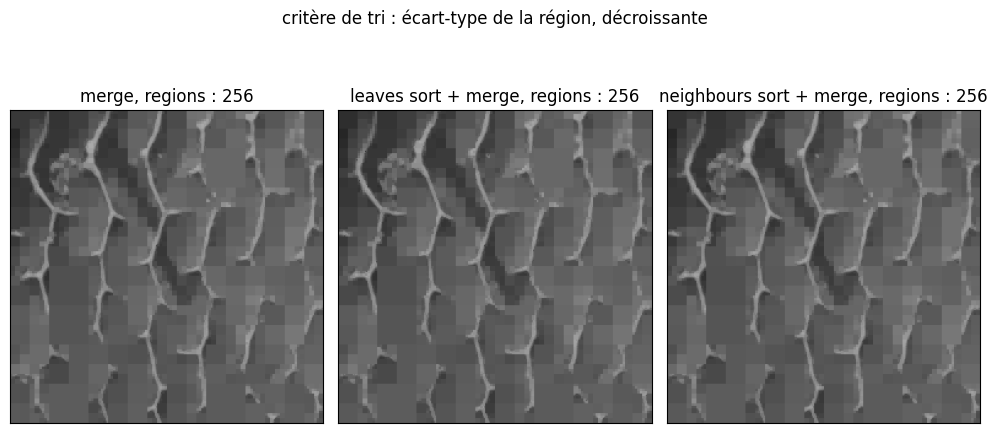

In [36]:
# seiche
test(seiche, 12, 1)

D'après les résultats de cette partie, le tri que nous effectuons sur les statistiques de l'image n'apporte pas des différences significatives : 
- Statistique de la moyenne de la région décroissante et statistique ed l'écart-type de la région décroissante : Nous remarquons des petites distinctions entre merge avec un tri sur les voisins, avec merge ainsi que merge avec un tri sur les feuilles.

- Statistique de la taille de la région décroissante : Nous remarquons des petites distinctions entre  merge avec un tri sur les feuilles, avec merge ainsi que merge avec un tri sur les voisins.

Ses différences sont notamment visibles dans l'image ```cam```.

### Question 3
Imagine and experiment alternative predicates for both the split and the merge steps. It is possible to use edges-based predicates, and also to combine with variance-based predicates.


In [ ]:
def predsplit_moyenne(I,reg,*args):
    """ Array*Block*... -> bool
    """ 
    x,y,w,h = reg
    mean = np.mean(I[x:x+w,y:y+h])
    return mean>args[0]

def predmerge_moyenne(b,R,*args):
    """ BlocsStat*Region*... -> bool 
        If merge, R[0] is modified
    """
    x,y,w,h,n1,mu1,sig1 = R[0]
    n2,mu2,sig2 = b[4:]

    n = n1+n2
    mu = (n1 * mu1 + n2 * mu2) / n
    sig = np.sqrt(((sig1*sig1 + mu1*mu1)*n1 + (sig2*sig2 + mu2*mu2)*n2)/n - mu*mu)

    if np.abs(mu1-mu2) <= args[0]:
        R[0] = x,y,w,h,n,mu,sig
        return True
    return False

def test_pred(I, *args):
    Lmoy = split(I, (0,0,*I.shape), predsplit_moyenne, I.mean()//2, 1)
    Mmoy = merge(Lmoy, I, predmerge_moyenne, I.mean()//2, 1)
    Rmoy = regions(Mmoy, I.shape)

    L = split(I, (0,0,*I.shape), predsplit, *args)
    M = merge(L, I, predmerge, *args)
    R = regions(M, I.shape)

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))
    
    ax[0].imshow(R, vmin=0, vmax=255, cmap="gray")
    ax[0].set_title("écart-type de la région")
    ax[0].set_xticks(())
    ax[0].set_yticks(())

    ax[1].imshow(Rmoy, vmin=0, vmax=255, cmap="gray")
    ax[1].set_title("moyenne de la région")
    ax[1].set_xticks(())
    ax[1].set_yticks(())

    fig.tight_layout()
    plt.show()

In [ ]:
test_pred(angio, 16, 1)

In [ ]:
for img, seuil in [(angio, 16), (cam, 30), (muscle, 22), (prisme, 15), (seiche, 12)]:
    test_pred(img, seuil, 1)